## Section 1 Import Libraries

In [1]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn import datasets, linear_model
from sklearn.metrics import mean_squared_error, r2_score
import pandas as pd
import seaborn as sns
import datetime
from  datetime import timedelta
import statsmodels.api as sm
%matplotlib inline
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
import warnings
warnings.filterwarnings('ignore')
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

# XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

## Section 2 Import Data

In [2]:
df_ClaimMasterTrans = pd.read_csv('data/Phase2_ClaimMasterTrans.csv', index_col = None, header =0)
df_MasterQuote = pd.read_csv('data/Phase2_MasterQuote.csv', index_col = None, header =0)
df_TheGeneral = pd.read_csv('data/Phase2_TheGeneral.csv', index_col = None, header = 0)
df_Abilitech = pd.read_csv('data/AP01.csv', index_col = None, header = 0)
df_demo = pd.read_csv('data/ap_demo.csv', index_col = None, header = 0)

# XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

## Section 3 Cluster Analysis

## Section 3.1 Prepare Abilitech Data for Cluster Analysis

In [3]:
df_Abilitech

,AbilitecContactID,ACX_ZIPCODE,ACX_ZIP4,AP005370_Carry_a_Combination_Term_and_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005370,AP005371_Carry_a_Credit_Life_Insurance_Policy_Fin_rank_base_20_AP005371,AP005372_Carry_a_Home_Insurance_Floater_Policy_for_Collections_Fin_rank_base_20_AP005372,AP005373_Carry_a_Home_Insurance_Floater_Policy_for_Jewelry_or_Furs_Fin_rank_base_20_AP005373,AP005374_Carry_a_Home_Insurance_Floater_Policy_or_Additional_Other_Coverage_Fin_rank_base_20_AP005374,AP005375_Carry_a_Separate_Term_Life_Insurance_Policy_Fin_rank_base_20_AP005375,AP005376_Carry_a_Separate_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005376,AP005377_Carry_a_Universal_Life_Insurance_Policy_Fin_rank_base_20_AP005377,AP005378_Cigna_Life_Insurance_Fin_rank_base_20_AP005378,AP005379_Farm_Bureau_Life_Insurance_Fin_rank_base_20_AP005379,AP005380_Farmers_Insurance_Group_Life_Insurance_Fin_rank_base_20_AP005380,AP005381_Genworth_Life_Insurance_Fin_rank_base_20_AP005381,AP005382_Gerber_Life_Insurance_Fin_rank_base_20_AP005382,AP005383_Guardian_Life_Insurance_Fin_rank_base_20_AP005383,AP005384_Have_Chubb_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005384,AP005385_Have_Country_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005385,AP005386_Have_Farmers_Insurance_Group_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005386,AP005387_Have_Foremost_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005387,AP005388_Have_Home_Insurance_On_a_Condominium_or_Co_Op_Fin_rank_base_20_AP005388,AP005389_Have_Liberty_Mutual_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005389,AP005390_Have_MetLife_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005390,AP005391_Have_Safeco_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005391,AP005392_Have_the_Hartford_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005392,AP005393_Have_Travelers_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005393,AP005394_ING_Life_Insurance_Fin_rank_base_20_AP005394,AP005395_John_Hancock_Life_Insurance_Fin_rank_base_20_AP005395,AP005396_Lincoln_Financial_Group_Life_Insurance_Fin_rank_base_20_AP005396,AP005397_MassMutual_Life_Insurance_Fin_rank_base_20_AP005397,AP005398_MetLife_Life_Insurance_Fin_rank_base_20_AP005398,AP005399_Mutual_of_Omaha_Life_Insurance_Fin_rank_base_20_AP005399,AP005400_Nationwide_Life_Insurance_Fin_rank_base_20_AP005400,AP005401_New_York_Life_Insurance_Fin_rank_base_20_AP005401,AP005402_Obtain_Accidental_Death_and_Dismemberment_Insurance_Fin_rank_base_20_AP005402,AP005403_Obtain_Boat_Owners_Insurance_Fin_rank_base_20_AP005403,AP005404_Obtain_Business_Insurance_Fin_rank_base_20_AP005404,AP005405_Obtain_Identity_Theft_Insurance_Fin_rank_base_20_AP005405,AP005406_Obtain_Life_Insurance_Along_with_Loan_Mortgage_Installment_Payments_Fin_rank_base_20_AP005406,AP005407_Obtain_Life_Insurance_Direct_from_Insurance_Company_in_Response_to_Direct_Mail_Fin_rank_base_20_AP005407,AP005408_Obtain_Life_Insurance_Direct_from_Insurance_Company_Via_Phone_Fin_rank_base_20_AP005408,AP005409_Obtain_Life_Insurance_from_a_Bank_Fin_rank_base_20_AP005409,AP005410_Obtain_Life_Insurance_from_a_Fraternal_or_Other_Membership_Group_Fin_rank_base_20_AP005410,AP005411_Obtain_Life_Insurance_from_a_Union_Fin_rank_base_20_AP005411,AP005412_Obtain_Life_Insurance_from_a_Veterans_Group_Fin_rank_base_20_AP005412,AP005413_Obtain_Life_Insurance_from_Work_Place_Fin_rank_base_20_AP005413,AP005414_Obtain_Life_Insurance_Through_an_Agent_or_Broker_Representing_Many_Companies_Fin_rank_base_20_AP005414,AP005415_Obtain_Life_Insurance_Through_an_Agent_Representing_One_Company_Fin_rank_base_20_AP005415,AP005417_Obtain_Personal_Liability_Insurance_Not_Included_On_Auto_and_Home_Policy_Fin_rank_base_20_AP005417,AP005418_Obtain_Travel_Insurance_Fin_rank_base_20_AP005418,AP005419_Prudential_Life_Insurance_Fin_rank_base_20_AP005419,AP005420_SBLI_Life_Insurance_Fin_rank_base_20_AP005420,AP005421_Someone_Else_in_th

In [4]:
df_Abilitech.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96501 entries, 0 to 96500
Columns: 302 entries, AbilitecContactID to IB7309_Bargain_Shoppers_ib7309
dtypes: float64(300), int64(1), object(1)
memory usage: 222.3+ MB


In [5]:
df_Abilitech = df_Abilitech.dropna(axis = 1, thresh = 75000 )

In [6]:
df_Abilitech

,AbilitecContactID,ACX_ZIPCODE,ACX_ZIP4,AP005370_Carry_a_Combination_Term_and_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005370,AP005371_Carry_a_Credit_Life_Insurance_Policy_Fin_rank_base_20_AP005371,AP005372_Carry_a_Home_Insurance_Floater_Policy_for_Collections_Fin_rank_base_20_AP005372,AP005373_Carry_a_Home_Insurance_Floater_Policy_for_Jewelry_or_Furs_Fin_rank_base_20_AP005373,AP005374_Carry_a_Home_Insurance_Floater_Policy_or_Additional_Other_Coverage_Fin_rank_base_20_AP005374,AP005375_Carry_a_Separate_Term_Life_Insurance_Policy_Fin_rank_base_20_AP005375,AP005376_Carry_a_Separate_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005376,AP005377_Carry_a_Universal_Life_Insurance_Policy_Fin_rank_base_20_AP005377,AP005378_Cigna_Life_Insurance_Fin_rank_base_20_AP005378,AP005379_Farm_Bureau_Life_Insurance_Fin_rank_base_20_AP005379,AP005380_Farmers_Insurance_Group_Life_Insurance_Fin_rank_base_20_AP005380,AP005381_Genworth_Life_Insurance_Fin_rank_base_20_AP005381,AP005382_Gerber_Life_Insurance_Fin_rank_base_20_AP005382,AP005383_Guardian_Life_Insurance_Fin_rank_base_20_AP005383,AP005384_Have_Chubb_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005384,AP005385_Have_Country_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005385,AP005386_Have_Farmers_Insurance_Group_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005386,AP005387_Have_Foremost_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005387,AP005388_Have_Home_Insurance_On_a_Condominium_or_Co_Op_Fin_rank_base_20_AP005388,AP005389_Have_Liberty_Mutual_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005389,AP005390_Have_MetLife_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005390,AP005391_Have_Safeco_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005391,AP005392_Have_the_Hartford_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005392,AP005393_Have_Travelers_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005393,AP005394_ING_Life_Insurance_Fin_rank_base_20_AP005394,AP005395_John_Hancock_Life_Insurance_Fin_rank_base_20_AP005395,AP005396_Lincoln_Financial_Group_Life_Insurance_Fin_rank_base_20_AP005396,AP005397_MassMutual_Life_Insurance_Fin_rank_base_20_AP005397,AP005398_MetLife_Life_Insurance_Fin_rank_base_20_AP005398,AP005399_Mutual_of_Omaha_Life_Insurance_Fin_rank_base_20_AP005399,AP005400_Nationwide_Life_Insurance_Fin_rank_base_20_AP005400,AP005401_New_York_Life_Insurance_Fin_rank_base_20_AP005401,AP005402_Obtain_Accidental_Death_and_Dismemberment_Insurance_Fin_rank_base_20_AP005402,AP005403_Obtain_Boat_Owners_Insurance_Fin_rank_base_20_AP005403,AP005404_Obtain_Business_Insurance_Fin_rank_base_20_AP005404,AP005405_Obtain_Identity_Theft_Insurance_Fin_rank_base_20_AP005405,AP005406_Obtain_Life_Insurance_Along_with_Loan_Mortgage_Installment_Payments_Fin_rank_base_20_AP005406,AP005407_Obtain_Life_Insurance_Direct_from_Insurance_Company_in_Response_to_Direct_Mail_Fin_rank_base_20_AP005407,AP005408_Obtain_Life_Insurance_Direct_from_Insurance_Company_Via_Phone_Fin_rank_base_20_AP005408,AP005409_Obtain_Life_Insurance_from_a_Bank_Fin_rank_base_20_AP005409,AP005410_Obtain_Life_Insurance_from_a_Fraternal_or_Other_Membership_Group_Fin_rank_base_20_AP005410,AP005411_Obtain_Life_Insurance_from_a_Union_Fin_rank_base_20_AP005411,AP005412_Obtain_Life_Insurance_from_a_Veterans_Group_Fin_rank_base_20_AP005412,AP005413_Obtain_Life_Insurance_from_Work_Place_Fin_rank_base_20_AP005413,AP005414_Obtain_Life_Insurance_Through_an_Agent_or_Broker_Representing_Many_Companies_Fin_rank_base_20_AP005414,AP005415_Obtain_Life_Insurance_Through_an_Agent_Representing_One_Company_Fin_rank_base_20_AP005415,AP005417_Obtain_Personal_Liability_Insurance_Not_Included_On_Auto_and_Home_Policy_Fin_rank_base_20_AP005417,AP005418_Obtain_Travel_Insurance_Fin_rank_base_20_AP005418,AP005419_Prudential_Life_Insurance_Fin_rank_base_20_AP005419,AP005420_SBLI_Life_Insurance_Fin_rank_base_20_AP005420,AP005421_Someone_Else_in_th

In [7]:
df_Abilitech = df_Abilitech.drop(['ACX_ZIPCODE','ACX_ZIP4'], axis = 1)

In [8]:
df_Abilitech

,AbilitecContactID,AP005370_Carry_a_Combination_Term_and_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005370,AP005371_Carry_a_Credit_Life_Insurance_Policy_Fin_rank_base_20_AP005371,AP005372_Carry_a_Home_Insurance_Floater_Policy_for_Collections_Fin_rank_base_20_AP005372,AP005373_Carry_a_Home_Insurance_Floater_Policy_for_Jewelry_or_Furs_Fin_rank_base_20_AP005373,AP005374_Carry_a_Home_Insurance_Floater_Policy_or_Additional_Other_Coverage_Fin_rank_base_20_AP005374,AP005375_Carry_a_Separate_Term_Life_Insurance_Policy_Fin_rank_base_20_AP005375,AP005376_Carry_a_Separate_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005376,AP005377_Carry_a_Universal_Life_Insurance_Policy_Fin_rank_base_20_AP005377,AP005378_Cigna_Life_Insurance_Fin_rank_base_20_AP005378,AP005379_Farm_Bureau_Life_Insurance_Fin_rank_base_20_AP005379,AP005380_Farmers_Insurance_Group_Life_Insurance_Fin_rank_base_20_AP005380,AP005381_Genworth_Life_Insurance_Fin_rank_base_20_AP005381,AP005382_Gerber_Life_Insurance_Fin_rank_base_20_AP005382,AP005383_Guardian_Life_Insurance_Fin_rank_base_20_AP005383,AP005384_Have_Chubb_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005384,AP005385_Have_Country_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005385,AP005386_Have_Farmers_Insurance_Group_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005386,AP005387_Have_Foremost_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005387,AP005388_Have_Home_Insurance_On_a_Condominium_or_Co_Op_Fin_rank_base_20_AP005388,AP005389_Have_Liberty_Mutual_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005389,AP005390_Have_MetLife_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005390,AP005391_Have_Safeco_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005391,AP005392_Have_the_Hartford_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005392,AP005393_Have_Travelers_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005393,AP005394_ING_Life_Insurance_Fin_rank_base_20_AP005394,AP005395_John_Hancock_Life_Insurance_Fin_rank_base_20_AP005395,AP005396_Lincoln_Financial_Group_Life_Insurance_Fin_rank_base_20_AP005396,AP005397_MassMutual_Life_Insurance_Fin_rank_base_20_AP005397,AP005398_MetLife_Life_Insurance_Fin_rank_base_20_AP005398,AP005399_Mutual_of_Omaha_Life_Insurance_Fin_rank_base_20_AP005399,AP005400_Nationwide_Life_Insurance_Fin_rank_base_20_AP005400,AP005401_New_York_Life_Insurance_Fin_rank_base_20_AP005401,AP005402_Obtain_Accidental_Death_and_Dismemberment_Insurance_Fin_rank_base_20_AP005402,AP005403_Obtain_Boat_Owners_Insurance_Fin_rank_base_20_AP005403,AP005404_Obtain_Business_Insurance_Fin_rank_base_20_AP005404,AP005405_Obtain_Identity_Theft_Insurance_Fin_rank_base_20_AP005405,AP005406_Obtain_Life_Insurance_Along_with_Loan_Mortgage_Installment_Payments_Fin_rank_base_20_AP005406,AP005407_Obtain_Life_Insurance_Direct_from_Insurance_Company_in_Response_to_Direct_Mail_Fin_rank_base_20_AP005407,AP005408_Obtain_Life_Insurance_Direct_from_Insurance_Company_Via_Phone_Fin_rank_base_20_AP005408,AP005409_Obtain_Life_Insurance_from_a_Bank_Fin_rank_base_20_AP005409,AP005410_Obtain_Life_Insurance_from_a_Fraternal_or_Other_Membership_Group_Fin_rank_base_20_AP005410,AP005411_Obtain_Life_Insurance_from_a_Union_Fin_rank_base_20_AP005411,AP005412_Obtain_Life_Insurance_from_a_Veterans_Group_Fin_rank_base_20_AP005412,AP005413_Obtain_Life_Insurance_from_Work_Place_Fin_rank_base_20_AP005413,AP005414_Obtain_Life_Insurance_Through_an_Agent_or_Broker_Representing_Many_Companies_Fin_rank_base_20_AP005414,AP005415_Obtain_Life_Insurance_Through_an_Agent_Representing_One_Company_Fin_rank_base_20_AP005415,AP005417_Obtain_Personal_Liability_Insurance_Not_Included_On_Auto_and_Home_Policy_Fin_rank_base_20_AP005417,AP005418_Obtain_Travel_Insurance_Fin_rank_base_20_AP005418,AP005419_Prudential_Life_Insurance_Fin_rank_base_20_AP005419,AP005420_SBLI_Life_Insurance_Fin_rank_base_20_AP005420,AP005421_Someone_Else_in_the_Family_Decided_On_H

In [9]:
df_Abilitech_columns = df_Abilitech.columns.values

In [10]:
df_Abilitech_columns

array(['AbilitecContactID',
       'AP005370_Carry_a_Combination_Term_and_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005370',
       'AP005371_Carry_a_Credit_Life_Insurance_Policy_Fin_rank_base_20_AP005371',
       'AP005372_Carry_a_Home_Insurance_Floater_Policy_for_Collections_Fin_rank_base_20_AP005372',
       'AP005373_Carry_a_Home_Insurance_Floater_Policy_for_Jewelry_or_Furs_Fin_rank_base_20_AP005373',
       'AP005374_Carry_a_Home_Insurance_Floater_Policy_or_Additional_Other_Coverage_Fin_rank_base_20_AP005374',
       'AP005375_Carry_a_Separate_Term_Life_Insurance_Policy_Fin_rank_base_20_AP005375',
       'AP005376_Carry_a_Separate_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005376',
       'AP005377_Carry_a_Universal_Life_Insurance_Policy_Fin_rank_base_20_AP005377',
       'AP005378_Cigna_Life_Insurance_Fin_rank_base_20_AP005378',
       'AP005379_Farm_Bureau_Life_Insurance_Fin_rank_base_20_AP005379',
       'AP005380_Farmers_Insurance_Group_Life_Insurance_Fin_rank_base_20

In [11]:
df_Abilitech_columns = pd.DataFrame(df_Abilitech_columns)
df_Abilitech_columns = df_Abilitech_columns.rename(columns = {0: 'ColumnName'})

In [12]:
df_Abilitech_list1 = df_Abilitech_columns[df_Abilitech_columns['ColumnName'].str.contains('Carry_a')]

In [13]:
df_Abilitech_list1

,ColumnName
1,AP005370_Carry_a_Combination_Term_and_Whole_Li...
2,AP005371_Carry_a_Credit_Life_Insurance_Policy_...
3,AP005372_Carry_a_Home_Insurance_Floater_Policy...
4,AP005373_Carry_a_Home_Insurance_Floater_Policy...
5,AP005374_Carry_a_Home_Insurance_Floater_Policy...
6,AP005375_Carry_a_Separate_Term_Life_Insurance_...
7,AP005376_Carry_a_Separate_Whole_Life_Insurance...
8,AP005377_Carry_a_Universal_Life_Insurance_Poli...


In [14]:
df_Abilitech_list2 = df_Abilitech_columns[df_Abilitech_columns['ColumnName'].str.contains('Insurance')]

In [15]:
df_Abilitech_list2

,ColumnName
1,AP005370_Carry_a_Combination_Term_and_Whole_Li...
2,AP005371_Carry_a_Credit_Life_Insurance_Policy_...
3,AP005372_Carry_a_Home_Insurance_Floater_Policy...
4,AP005373_Carry_a_Home_Insurance_Floater_Policy...
5,AP005374_Carry_a_Home_Insurance_Floater_Policy...
6,AP005375_Carry_a_Separate_Term_Life_Insurance_...
7,AP005376_Carry_a_Separate_Whole_Life_Insurance...
8,AP005377_Carry_a_Universal_Life_Insurance_Poli...
9,AP005378_Cigna_Life_Insurance_Fin_rank_base_20...
10,AP005379_Farm_Bureau_Life_Insurance_Fin_rank_b...


In [16]:
df_Abilitech_list3 = df_Abilitech_columns[df_Abilitech_columns['ColumnName'].str.contains('Acquired')]

In [17]:
df_Abilitech_list3

,ColumnName
56,AP005426_Acquired_Common_Stock_in_Any_Company_...
57,AP005427_Acquired_US_Savings_Bonds_in_the_Last...
58,AP005428_Annuities_Acquired_in_the_Last_Twelve...


In [18]:

df_Abilitech_list4 = df_Abilitech_columns[df_Abilitech_columns['ColumnName'].str.contains('Have_Met_with_a_Financial_Planner')]

In [19]:
df_Abilitech_list4

,ColumnName
68,AP005446_Have_Met_with_a_Financial_Planner_Fin...


In [20]:
df_Abilitech_list5 = df_Abilitech_columns[df_Abilitech_columns['ColumnName'].str.contains('Brokerage')]

In [21]:
df_Abilitech_list5

,ColumnName
59,AP005430_Buy_Sell_Bonds_Using_a_Full_Service_B...
60,AP005431_Buy_Sell_Mutual_Funds_Using_a_Full_Se...
61,AP005432_Buy_Sell_Stocks_Using_a_Discount_Brok...
64,AP005437_Get_Advice_Price_Quotes_from_a_Full_S...
71,AP005450_Other_Online_Brokerage_Firm_Fin_rank_...


In [22]:
df_Abilitech_list6 = df_Abilitech_columns[df_Abilitech_columns['ColumnName'].str.contains('Have_Household_Membership')]

In [23]:
df_Abilitech_list6

,ColumnName
92,AP005501_Have_Household_Membership_in_Airline_...
93,AP005502_Have_Household_Membership_in_Any_Priv...
94,AP005503_Have_Household_Membership_in_Athletic...
95,AP005504_Have_Household_Membership_in_Beach_or...
96,AP005505_Have_Household_Membership_in_Boat_or_...
97,AP005506_Have_Household_Membership_in_Country_...
98,AP005507_Have_Household_Membership_in_Metropol...
99,AP005508_Have_Household_Membership_in_Other_Pr...
100,AP005509_Have_Household_Membership_in_Universi...


In [24]:
df_Abilitech_list = pd.concat([df_Abilitech_list1, df_Abilitech_list2, df_Abilitech_list3,df_Abilitech_list4,df_Abilitech_list5,df_Abilitech_list6], axis = 0)

In [25]:
df_Abilitech_list

,ColumnName
1,AP005370_Carry_a_Combination_Term_and_Whole_Li...
2,AP005371_Carry_a_Credit_Life_Insurance_Policy_...
3,AP005372_Carry_a_Home_Insurance_Floater_Policy...
4,AP005373_Carry_a_Home_Insurance_Floater_Policy...
5,AP005374_Carry_a_Home_Insurance_Floater_Policy...
6,AP005375_Carry_a_Separate_Term_Life_Insurance_...
7,AP005376_Carry_a_Separate_Whole_Life_Insurance...
8,AP005377_Carry_a_Universal_Life_Insurance_Poli...
1,AP005370_Carry_a_Combination_Term_and_Whole_Li...
2,AP005371_Carry_a_Credit_Life_Insurance_Policy_...


In [26]:
var_Abilitech = df_Abilitech_list['ColumnName']

In [27]:
df_Abilitech_Final = df_Abilitech[var_Abilitech]

In [28]:
df_Abilitech_Final

,AP005370_Carry_a_Combination_Term_and_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005370,AP005371_Carry_a_Credit_Life_Insurance_Policy_Fin_rank_base_20_AP005371,AP005372_Carry_a_Home_Insurance_Floater_Policy_for_Collections_Fin_rank_base_20_AP005372,AP005373_Carry_a_Home_Insurance_Floater_Policy_for_Jewelry_or_Furs_Fin_rank_base_20_AP005373,AP005374_Carry_a_Home_Insurance_Floater_Policy_or_Additional_Other_Coverage_Fin_rank_base_20_AP005374,AP005375_Carry_a_Separate_Term_Life_Insurance_Policy_Fin_rank_base_20_AP005375,AP005376_Carry_a_Separate_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005376,AP005377_Carry_a_Universal_Life_Insurance_Policy_Fin_rank_base_20_AP005377,AP005370_Carry_a_Combination_Term_and_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005370,AP005371_Carry_a_Credit_Life_Insurance_Policy_Fin_rank_base_20_AP005371,AP005372_Carry_a_Home_Insurance_Floater_Policy_for_Collections_Fin_rank_base_20_AP005372,AP005373_Carry_a_Home_Insurance_Floater_Policy_for_Jewelry_or_Furs_Fin_rank_base_20_AP005373,AP005374_Carry_a_Home_Insurance_Floater_Policy_or_Additional_Other_Coverage_Fin_rank_base_20_AP005374,AP005375_Carry_a_Separate_Term_Life_Insurance_Policy_Fin_rank_base_20_AP005375,AP005376_Carry_a_Separate_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005376,AP005377_Carry_a_Universal_Life_Insurance_Policy_Fin_rank_base_20_AP005377,AP005378_Cigna_Life_Insurance_Fin_rank_base_20_AP005378,AP005379_Farm_Bureau_Life_Insurance_Fin_rank_base_20_AP005379,AP005380_Farmers_Insurance_Group_Life_Insurance_Fin_rank_base_20_AP005380,AP005381_Genworth_Life_Insurance_Fin_rank_base_20_AP005381,AP005382_Gerber_Life_Insurance_Fin_rank_base_20_AP005382,AP005383_Guardian_Life_Insurance_Fin_rank_base_20_AP005383,AP005384_Have_Chubb_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005384,AP005385_Have_Country_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005385,AP005386_Have_Farmers_Insurance_Group_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005386,AP005387_Have_Foremost_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005387,AP005388_Have_Home_Insurance_On_a_Condominium_or_Co_Op_Fin_rank_base_20_AP005388,AP005389_Have_Liberty_Mutual_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005389,AP005390_Have_MetLife_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005390,AP005391_Have_Safeco_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005391,AP005392_Have_the_Hartford_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005392,AP005393_Have_Travelers_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005393,AP005394_ING_Life_Insurance_Fin_rank_base_20_AP005394,AP005395_John_Hancock_Life_Insurance_Fin_rank_base_20_AP005395,AP005396_Lincoln_Financial_Group_Life_Insurance_Fin_rank_base_20_AP005396,AP005397_MassMutual_Life_Insurance_Fin_rank_base_20_AP005397,AP005398_MetLife_Life_Insurance_Fin_rank_base_20_AP005398,AP005399_Mutual_of_Omaha_Life_Insurance_Fin_rank_base_20_AP005399,AP005400_Nationwide_Life_Insurance_Fin_rank_base_20_AP005400,AP005401_New_York_Life_Insurance_Fin_rank_base_20_AP005401,AP005402_Obtain_Accidental_Death_and_Dismemberment_Insurance_Fin_rank_base_20_AP005402,AP005403_Obtain_Boat_Owners_Insurance_Fin_rank_base_20_AP005403,AP005404_Obtain_Business_Insurance_Fin_rank_base_20_AP005404,AP005405_Obtain_Identity_Theft_Insurance_Fin_rank_base_20_AP005405,AP005406_Obtain_Life_Insurance_Along_with_Loan_Mortgage_Installment_Payments_Fin_rank_base_20_AP005406,AP005407_Obtain_Life_Insurance_Direct_from_Insurance_Company_in_Response_to_Direct_Mail_Fin_rank_base_20_AP005407,AP005408_Obtain_Life_Insurance_Direct_from_Insurance_Company_Via_Phone_Fin_rank_base_20_AP005408,AP005409_Obtain_Life_Insurance_from_a_Bank_Fin_rank_base_20_AP005409,AP005410_Obtain_Life_Insurance_from_a_Fraternal_or_Other_Membership_Group_Fin_rank_base_20_AP005410,AP005411_Obtain_Life_Insurance_from_a_Union_Fin_rank_base_20_AP005411,AP005412_Obtain_Life_Insurance

In [29]:
df_Abilitech_ID = df_Abilitech['AbilitecContactID']
df_Abilitech_ID.head(5)

0    04ZJUS11ZZY02CX2
1    04ZJUS11ZZX6Z5PH
2    04ZJUS11ZZVK414Y
3    04ZJUS11ZZV842QB
4    04ZJUS11ZZTVWBDL
Name: AbilitecContactID, dtype: object

In [30]:
df_Abilitech_Final = pd.concat([df_Abilitech_ID,df_Abilitech_Final],axis = 1)

In [31]:
df_Abilitech_Final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96501 entries, 0 to 96500
Data columns (total 84 columns):
 #   Column                                                                                                             Non-Null Count  Dtype  
---  ------                                                                                                             --------------  -----  
 0   AbilitecContactID                                                                                                  96501 non-null  object 
 1   AP005370_Carry_a_Combination_Term_and_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005370                        84082 non-null  float64
 2   AP005371_Carry_a_Credit_Life_Insurance_Policy_Fin_rank_base_20_AP005371                                            84082 non-null  float64
 3   AP005372_Carry_a_Home_Insurance_Floater_Policy_for_Collections_Fin_rank_base_20_AP005372                           84082 non-null  float64
 4   AP005373_Carry_a_Home_

In [32]:
df_Abilitech_Final

,AbilitecContactID,AP005370_Carry_a_Combination_Term_and_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005370,AP005371_Carry_a_Credit_Life_Insurance_Policy_Fin_rank_base_20_AP005371,AP005372_Carry_a_Home_Insurance_Floater_Policy_for_Collections_Fin_rank_base_20_AP005372,AP005373_Carry_a_Home_Insurance_Floater_Policy_for_Jewelry_or_Furs_Fin_rank_base_20_AP005373,AP005374_Carry_a_Home_Insurance_Floater_Policy_or_Additional_Other_Coverage_Fin_rank_base_20_AP005374,AP005375_Carry_a_Separate_Term_Life_Insurance_Policy_Fin_rank_base_20_AP005375,AP005376_Carry_a_Separate_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005376,AP005377_Carry_a_Universal_Life_Insurance_Policy_Fin_rank_base_20_AP005377,AP005370_Carry_a_Combination_Term_and_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005370,AP005371_Carry_a_Credit_Life_Insurance_Policy_Fin_rank_base_20_AP005371,AP005372_Carry_a_Home_Insurance_Floater_Policy_for_Collections_Fin_rank_base_20_AP005372,AP005373_Carry_a_Home_Insurance_Floater_Policy_for_Jewelry_or_Furs_Fin_rank_base_20_AP005373,AP005374_Carry_a_Home_Insurance_Floater_Policy_or_Additional_Other_Coverage_Fin_rank_base_20_AP005374,AP005375_Carry_a_Separate_Term_Life_Insurance_Policy_Fin_rank_base_20_AP005375,AP005376_Carry_a_Separate_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005376,AP005377_Carry_a_Universal_Life_Insurance_Policy_Fin_rank_base_20_AP005377,AP005378_Cigna_Life_Insurance_Fin_rank_base_20_AP005378,AP005379_Farm_Bureau_Life_Insurance_Fin_rank_base_20_AP005379,AP005380_Farmers_Insurance_Group_Life_Insurance_Fin_rank_base_20_AP005380,AP005381_Genworth_Life_Insurance_Fin_rank_base_20_AP005381,AP005382_Gerber_Life_Insurance_Fin_rank_base_20_AP005382,AP005383_Guardian_Life_Insurance_Fin_rank_base_20_AP005383,AP005384_Have_Chubb_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005384,AP005385_Have_Country_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005385,AP005386_Have_Farmers_Insurance_Group_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005386,AP005387_Have_Foremost_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005387,AP005388_Have_Home_Insurance_On_a_Condominium_or_Co_Op_Fin_rank_base_20_AP005388,AP005389_Have_Liberty_Mutual_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005389,AP005390_Have_MetLife_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005390,AP005391_Have_Safeco_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005391,AP005392_Have_the_Hartford_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005392,AP005393_Have_Travelers_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005393,AP005394_ING_Life_Insurance_Fin_rank_base_20_AP005394,AP005395_John_Hancock_Life_Insurance_Fin_rank_base_20_AP005395,AP005396_Lincoln_Financial_Group_Life_Insurance_Fin_rank_base_20_AP005396,AP005397_MassMutual_Life_Insurance_Fin_rank_base_20_AP005397,AP005398_MetLife_Life_Insurance_Fin_rank_base_20_AP005398,AP005399_Mutual_of_Omaha_Life_Insurance_Fin_rank_base_20_AP005399,AP005400_Nationwide_Life_Insurance_Fin_rank_base_20_AP005400,AP005401_New_York_Life_Insurance_Fin_rank_base_20_AP005401,AP005402_Obtain_Accidental_Death_and_Dismemberment_Insurance_Fin_rank_base_20_AP005402,AP005403_Obtain_Boat_Owners_Insurance_Fin_rank_base_20_AP005403,AP005404_Obtain_Business_Insurance_Fin_rank_base_20_AP005404,AP005405_Obtain_Identity_Theft_Insurance_Fin_rank_base_20_AP005405,AP005406_Obtain_Life_Insurance_Along_with_Loan_Mortgage_Installment_Payments_Fin_rank_base_20_AP005406,AP005407_Obtain_Life_Insurance_Direct_from_Insurance_Company_in_Response_to_Direct_Mail_Fin_rank_base_20_AP005407,AP005408_Obtain_Life_Insurance_Direct_from_Insurance_Company_Via_Phone_Fin_rank_base_20_AP005408,AP005409_Obtain_Life_Insurance_from_a_Bank_Fin_rank_base_20_AP005409,AP005410_Obtain_Life_Insurance_from_a_Fraternal_or_Other_Membership_Group_Fin_rank_base_20_AP005410,AP005411_Obtain_Life_Insurance_from_a_Union_Fin_rank_base_20_AP005411,AP005412_Obt

In [33]:
df_Abilitech_Final = df_Abilitech_Final.dropna(axis =0, how = 'all', thresh = 84)

In [34]:
df_Abilitech_Final

,AbilitecContactID,AP005370_Carry_a_Combination_Term_and_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005370,AP005371_Carry_a_Credit_Life_Insurance_Policy_Fin_rank_base_20_AP005371,AP005372_Carry_a_Home_Insurance_Floater_Policy_for_Collections_Fin_rank_base_20_AP005372,AP005373_Carry_a_Home_Insurance_Floater_Policy_for_Jewelry_or_Furs_Fin_rank_base_20_AP005373,AP005374_Carry_a_Home_Insurance_Floater_Policy_or_Additional_Other_Coverage_Fin_rank_base_20_AP005374,AP005375_Carry_a_Separate_Term_Life_Insurance_Policy_Fin_rank_base_20_AP005375,AP005376_Carry_a_Separate_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005376,AP005377_Carry_a_Universal_Life_Insurance_Policy_Fin_rank_base_20_AP005377,AP005370_Carry_a_Combination_Term_and_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005370,AP005371_Carry_a_Credit_Life_Insurance_Policy_Fin_rank_base_20_AP005371,AP005372_Carry_a_Home_Insurance_Floater_Policy_for_Collections_Fin_rank_base_20_AP005372,AP005373_Carry_a_Home_Insurance_Floater_Policy_for_Jewelry_or_Furs_Fin_rank_base_20_AP005373,AP005374_Carry_a_Home_Insurance_Floater_Policy_or_Additional_Other_Coverage_Fin_rank_base_20_AP005374,AP005375_Carry_a_Separate_Term_Life_Insurance_Policy_Fin_rank_base_20_AP005375,AP005376_Carry_a_Separate_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005376,AP005377_Carry_a_Universal_Life_Insurance_Policy_Fin_rank_base_20_AP005377,AP005378_Cigna_Life_Insurance_Fin_rank_base_20_AP005378,AP005379_Farm_Bureau_Life_Insurance_Fin_rank_base_20_AP005379,AP005380_Farmers_Insurance_Group_Life_Insurance_Fin_rank_base_20_AP005380,AP005381_Genworth_Life_Insurance_Fin_rank_base_20_AP005381,AP005382_Gerber_Life_Insurance_Fin_rank_base_20_AP005382,AP005383_Guardian_Life_Insurance_Fin_rank_base_20_AP005383,AP005384_Have_Chubb_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005384,AP005385_Have_Country_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005385,AP005386_Have_Farmers_Insurance_Group_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005386,AP005387_Have_Foremost_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005387,AP005388_Have_Home_Insurance_On_a_Condominium_or_Co_Op_Fin_rank_base_20_AP005388,AP005389_Have_Liberty_Mutual_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005389,AP005390_Have_MetLife_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005390,AP005391_Have_Safeco_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005391,AP005392_Have_the_Hartford_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005392,AP005393_Have_Travelers_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005393,AP005394_ING_Life_Insurance_Fin_rank_base_20_AP005394,AP005395_John_Hancock_Life_Insurance_Fin_rank_base_20_AP005395,AP005396_Lincoln_Financial_Group_Life_Insurance_Fin_rank_base_20_AP005396,AP005397_MassMutual_Life_Insurance_Fin_rank_base_20_AP005397,AP005398_MetLife_Life_Insurance_Fin_rank_base_20_AP005398,AP005399_Mutual_of_Omaha_Life_Insurance_Fin_rank_base_20_AP005399,AP005400_Nationwide_Life_Insurance_Fin_rank_base_20_AP005400,AP005401_New_York_Life_Insurance_Fin_rank_base_20_AP005401,AP005402_Obtain_Accidental_Death_and_Dismemberment_Insurance_Fin_rank_base_20_AP005402,AP005403_Obtain_Boat_Owners_Insurance_Fin_rank_base_20_AP005403,AP005404_Obtain_Business_Insurance_Fin_rank_base_20_AP005404,AP005405_Obtain_Identity_Theft_Insurance_Fin_rank_base_20_AP005405,AP005406_Obtain_Life_Insurance_Along_with_Loan_Mortgage_Installment_Payments_Fin_rank_base_20_AP005406,AP005407_Obtain_Life_Insurance_Direct_from_Insurance_Company_in_Response_to_Direct_Mail_Fin_rank_base_20_AP005407,AP005408_Obtain_Life_Insurance_Direct_from_Insurance_Company_Via_Phone_Fin_rank_base_20_AP005408,AP005409_Obtain_Life_Insurance_from_a_Bank_Fin_rank_base_20_AP005409,AP005410_Obtain_Life_Insurance_from_a_Fraternal_or_Other_Membership_Group_Fin_rank_base_20_AP005410,AP005411_Obtain_Life_Insurance_from_a_Union_Fin_rank_base_20_AP005411,AP005412_Obt

In [35]:
df_Abilitech_Final = df_Abilitech_Final.reset_index()

In [36]:
df_Abilitech_Final


,index,AbilitecContactID,AP005370_Carry_a_Combination_Term_and_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005370,AP005371_Carry_a_Credit_Life_Insurance_Policy_Fin_rank_base_20_AP005371,AP005372_Carry_a_Home_Insurance_Floater_Policy_for_Collections_Fin_rank_base_20_AP005372,AP005373_Carry_a_Home_Insurance_Floater_Policy_for_Jewelry_or_Furs_Fin_rank_base_20_AP005373,AP005374_Carry_a_Home_Insurance_Floater_Policy_or_Additional_Other_Coverage_Fin_rank_base_20_AP005374,AP005375_Carry_a_Separate_Term_Life_Insurance_Policy_Fin_rank_base_20_AP005375,AP005376_Carry_a_Separate_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005376,AP005377_Carry_a_Universal_Life_Insurance_Policy_Fin_rank_base_20_AP005377,AP005370_Carry_a_Combination_Term_and_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005370,AP005371_Carry_a_Credit_Life_Insurance_Policy_Fin_rank_base_20_AP005371,AP005372_Carry_a_Home_Insurance_Floater_Policy_for_Collections_Fin_rank_base_20_AP005372,AP005373_Carry_a_Home_Insurance_Floater_Policy_for_Jewelry_or_Furs_Fin_rank_base_20_AP005373,AP005374_Carry_a_Home_Insurance_Floater_Policy_or_Additional_Other_Coverage_Fin_rank_base_20_AP005374,AP005375_Carry_a_Separate_Term_Life_Insurance_Policy_Fin_rank_base_20_AP005375,AP005376_Carry_a_Separate_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005376,AP005377_Carry_a_Universal_Life_Insurance_Policy_Fin_rank_base_20_AP005377,AP005378_Cigna_Life_Insurance_Fin_rank_base_20_AP005378,AP005379_Farm_Bureau_Life_Insurance_Fin_rank_base_20_AP005379,AP005380_Farmers_Insurance_Group_Life_Insurance_Fin_rank_base_20_AP005380,AP005381_Genworth_Life_Insurance_Fin_rank_base_20_AP005381,AP005382_Gerber_Life_Insurance_Fin_rank_base_20_AP005382,AP005383_Guardian_Life_Insurance_Fin_rank_base_20_AP005383,AP005384_Have_Chubb_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005384,AP005385_Have_Country_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005385,AP005386_Have_Farmers_Insurance_Group_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005386,AP005387_Have_Foremost_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005387,AP005388_Have_Home_Insurance_On_a_Condominium_or_Co_Op_Fin_rank_base_20_AP005388,AP005389_Have_Liberty_Mutual_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005389,AP005390_Have_MetLife_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005390,AP005391_Have_Safeco_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005391,AP005392_Have_the_Hartford_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005392,AP005393_Have_Travelers_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005393,AP005394_ING_Life_Insurance_Fin_rank_base_20_AP005394,AP005395_John_Hancock_Life_Insurance_Fin_rank_base_20_AP005395,AP005396_Lincoln_Financial_Group_Life_Insurance_Fin_rank_base_20_AP005396,AP005397_MassMutual_Life_Insurance_Fin_rank_base_20_AP005397,AP005398_MetLife_Life_Insurance_Fin_rank_base_20_AP005398,AP005399_Mutual_of_Omaha_Life_Insurance_Fin_rank_base_20_AP005399,AP005400_Nationwide_Life_Insurance_Fin_rank_base_20_AP005400,AP005401_New_York_Life_Insurance_Fin_rank_base_20_AP005401,AP005402_Obtain_Accidental_Death_and_Dismemberment_Insurance_Fin_rank_base_20_AP005402,AP005403_Obtain_Boat_Owners_Insurance_Fin_rank_base_20_AP005403,AP005404_Obtain_Business_Insurance_Fin_rank_base_20_AP005404,AP005405_Obtain_Identity_Theft_Insurance_Fin_rank_base_20_AP005405,AP005406_Obtain_Life_Insurance_Along_with_Loan_Mortgage_Installment_Payments_Fin_rank_base_20_AP005406,AP005407_Obtain_Life_Insurance_Direct_from_Insurance_Company_in_Response_to_Direct_Mail_Fin_rank_base_20_AP005407,AP005408_Obtain_Life_Insurance_Direct_from_Insurance_Company_Via_Phone_Fin_rank_base_20_AP005408,AP005409_Obtain_Life_Insurance_from_a_Bank_Fin_rank_base_20_AP005409,AP005410_Obtain_Life_Insurance_from_a_Fraternal_or_Other_Membership_Group_Fin_rank_base_20_AP005410,AP005411_Obtain_Life_Insurance_from_a_Union_Fin_rank_base_20_AP005411,AP0054

## Section 3.2 Run Cluster Analysis

In [37]:
df_Abilitech_Final_Cluster =  df_Abilitech_Final.drop(columns = 'AbilitecContactID')

In [38]:
scaler.fit(df_Abilitech_Final_Cluster)
StandardScaler(copy=True, with_mean=True, with_std=True)

StandardScaler()

In [39]:
Abilitech_scaled = scaler.transform(df_Abilitech_Final_Cluster)

In [40]:
Abilitech_scaled

array([[-1.97364731, -0.31926141, -1.43523661, ..., -0.37990919,
        -1.19379466,  0.59254782],
       [-1.97357092, -0.88824228,  1.57093197, ..., -0.56290896,
         0.41478533, -0.10743891],
       [-1.97345635,  1.00836062,  0.63150429, ..., -0.19690942,
        -0.30013911, -1.50741238],
       ...,
       [ 1.71173835,  0.62904004,  0.25573322, ...,  1.26708872,
        -1.37252577,  0.7675445 ],
       [ 1.71177654,  1.57734149, -0.87158   , ..., -0.01390965,
         0.23605422,  1.29253455],
       [ 1.71181473,  0.81870033,  0.44361875, ..., -0.19690942,
        -0.30013911, -0.63242896]])

iteration 1 done
iteration 2 done
iteration 3 done
iteration 4 done
iteration 5 done
iteration 6 done
iteration 7 done
iteration 8 done
iteration 9 done
iteration 10 done
iteration 11 done
iteration 12 done
iteration 13 done
iteration 14 done
iteration 15 done
iteration 16 done
iteration 17 done
iteration 18 done
iteration 19 done
iteration 20 done


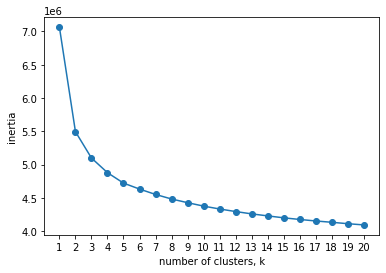

In [41]:
ks = range(1, 21)

inertias =[]

 

for k in ks:

    model = KMeans(n_clusters=k)

    model.fit(Abilitech_scaled)

    inertias.append(model.inertia_)

    print('iteration {} done'.format(k))

   

plt.plot(ks, inertias, '-o')

plt.xlabel('number of clusters, k')

plt.ylabel('inertia')

plt.xticks(ks)

plt.show()

In [42]:
k_means_model = KMeans(n_clusters=4, random_state = 27)
k_means_model.fit(Abilitech_scaled)

KMeans(n_clusters=4, random_state=27)

In [43]:
cluster_labels = k_means_model.predict(Abilitech_scaled)
cluster_labels = pd.DataFrame(cluster_labels)

In [44]:
cluster_labels

,0
0,2
1,3
2,3
3,1
4,1
...,...
84077,0
84078,2
84079,1
84080,1


In [45]:
cluster_results = pd.concat([cluster_labels, df_Abilitech_Final], axis=1)
cluster_results = cluster_results.rename(columns = {0: 'cluster_labels'})


In [46]:
cluster_results

,cluster_labels,index,AbilitecContactID,AP005370_Carry_a_Combination_Term_and_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005370,AP005371_Carry_a_Credit_Life_Insurance_Policy_Fin_rank_base_20_AP005371,AP005372_Carry_a_Home_Insurance_Floater_Policy_for_Collections_Fin_rank_base_20_AP005372,AP005373_Carry_a_Home_Insurance_Floater_Policy_for_Jewelry_or_Furs_Fin_rank_base_20_AP005373,AP005374_Carry_a_Home_Insurance_Floater_Policy_or_Additional_Other_Coverage_Fin_rank_base_20_AP005374,AP005375_Carry_a_Separate_Term_Life_Insurance_Policy_Fin_rank_base_20_AP005375,AP005376_Carry_a_Separate_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005376,AP005377_Carry_a_Universal_Life_Insurance_Policy_Fin_rank_base_20_AP005377,AP005370_Carry_a_Combination_Term_and_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005370,AP005371_Carry_a_Credit_Life_Insurance_Policy_Fin_rank_base_20_AP005371,AP005372_Carry_a_Home_Insurance_Floater_Policy_for_Collections_Fin_rank_base_20_AP005372,AP005373_Carry_a_Home_Insurance_Floater_Policy_for_Jewelry_or_Furs_Fin_rank_base_20_AP005373,AP005374_Carry_a_Home_Insurance_Floater_Policy_or_Additional_Other_Coverage_Fin_rank_base_20_AP005374,AP005375_Carry_a_Separate_Term_Life_Insurance_Policy_Fin_rank_base_20_AP005375,AP005376_Carry_a_Separate_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005376,AP005377_Carry_a_Universal_Life_Insurance_Policy_Fin_rank_base_20_AP005377,AP005378_Cigna_Life_Insurance_Fin_rank_base_20_AP005378,AP005379_Farm_Bureau_Life_Insurance_Fin_rank_base_20_AP005379,AP005380_Farmers_Insurance_Group_Life_Insurance_Fin_rank_base_20_AP005380,AP005381_Genworth_Life_Insurance_Fin_rank_base_20_AP005381,AP005382_Gerber_Life_Insurance_Fin_rank_base_20_AP005382,AP005383_Guardian_Life_Insurance_Fin_rank_base_20_AP005383,AP005384_Have_Chubb_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005384,AP005385_Have_Country_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005385,AP005386_Have_Farmers_Insurance_Group_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005386,AP005387_Have_Foremost_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005387,AP005388_Have_Home_Insurance_On_a_Condominium_or_Co_Op_Fin_rank_base_20_AP005388,AP005389_Have_Liberty_Mutual_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005389,AP005390_Have_MetLife_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005390,AP005391_Have_Safeco_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005391,AP005392_Have_the_Hartford_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005392,AP005393_Have_Travelers_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005393,AP005394_ING_Life_Insurance_Fin_rank_base_20_AP005394,AP005395_John_Hancock_Life_Insurance_Fin_rank_base_20_AP005395,AP005396_Lincoln_Financial_Group_Life_Insurance_Fin_rank_base_20_AP005396,AP005397_MassMutual_Life_Insurance_Fin_rank_base_20_AP005397,AP005398_MetLife_Life_Insurance_Fin_rank_base_20_AP005398,AP005399_Mutual_of_Omaha_Life_Insurance_Fin_rank_base_20_AP005399,AP005400_Nationwide_Life_Insurance_Fin_rank_base_20_AP005400,AP005401_New_York_Life_Insurance_Fin_rank_base_20_AP005401,AP005402_Obtain_Accidental_Death_and_Dismemberment_Insurance_Fin_rank_base_20_AP005402,AP005403_Obtain_Boat_Owners_Insurance_Fin_rank_base_20_AP005403,AP005404_Obtain_Business_Insurance_Fin_rank_base_20_AP005404,AP005405_Obtain_Identity_Theft_Insurance_Fin_rank_base_20_AP005405,AP005406_Obtain_Life_Insurance_Along_with_Loan_Mortgage_Installment_Payments_Fin_rank_base_20_AP005406,AP005407_Obtain_Life_Insurance_Direct_from_Insurance_Company_in_Response_to_Direct_Mail_Fin_rank_base_20_AP005407,AP005408_Obtain_Life_Insurance_Direct_from_Insurance_Company_Via_Phone_Fin_rank_base_20_AP005408,AP005409_Obtain_Life_Insurance_from_a_Bank_Fin_rank_base_20_AP005409,AP005410_Obtain_Life_Insurance_from_a_Fraternal_or_Other_Membership_Group_Fin_rank_base_20_AP005410,AP005411_Obtain_Life_Insurance_from_a_Union_Fin_rank_base_20_

In [47]:
cluster_results = cluster_results.drop(cluster_results.columns[[1]], axis =1)

In [48]:
cluster_results

,cluster_labels,AbilitecContactID,AP005370_Carry_a_Combination_Term_and_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005370,AP005371_Carry_a_Credit_Life_Insurance_Policy_Fin_rank_base_20_AP005371,AP005372_Carry_a_Home_Insurance_Floater_Policy_for_Collections_Fin_rank_base_20_AP005372,AP005373_Carry_a_Home_Insurance_Floater_Policy_for_Jewelry_or_Furs_Fin_rank_base_20_AP005373,AP005374_Carry_a_Home_Insurance_Floater_Policy_or_Additional_Other_Coverage_Fin_rank_base_20_AP005374,AP005375_Carry_a_Separate_Term_Life_Insurance_Policy_Fin_rank_base_20_AP005375,AP005376_Carry_a_Separate_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005376,AP005377_Carry_a_Universal_Life_Insurance_Policy_Fin_rank_base_20_AP005377,AP005370_Carry_a_Combination_Term_and_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005370,AP005371_Carry_a_Credit_Life_Insurance_Policy_Fin_rank_base_20_AP005371,AP005372_Carry_a_Home_Insurance_Floater_Policy_for_Collections_Fin_rank_base_20_AP005372,AP005373_Carry_a_Home_Insurance_Floater_Policy_for_Jewelry_or_Furs_Fin_rank_base_20_AP005373,AP005374_Carry_a_Home_Insurance_Floater_Policy_or_Additional_Other_Coverage_Fin_rank_base_20_AP005374,AP005375_Carry_a_Separate_Term_Life_Insurance_Policy_Fin_rank_base_20_AP005375,AP005376_Carry_a_Separate_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005376,AP005377_Carry_a_Universal_Life_Insurance_Policy_Fin_rank_base_20_AP005377,AP005378_Cigna_Life_Insurance_Fin_rank_base_20_AP005378,AP005379_Farm_Bureau_Life_Insurance_Fin_rank_base_20_AP005379,AP005380_Farmers_Insurance_Group_Life_Insurance_Fin_rank_base_20_AP005380,AP005381_Genworth_Life_Insurance_Fin_rank_base_20_AP005381,AP005382_Gerber_Life_Insurance_Fin_rank_base_20_AP005382,AP005383_Guardian_Life_Insurance_Fin_rank_base_20_AP005383,AP005384_Have_Chubb_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005384,AP005385_Have_Country_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005385,AP005386_Have_Farmers_Insurance_Group_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005386,AP005387_Have_Foremost_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005387,AP005388_Have_Home_Insurance_On_a_Condominium_or_Co_Op_Fin_rank_base_20_AP005388,AP005389_Have_Liberty_Mutual_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005389,AP005390_Have_MetLife_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005390,AP005391_Have_Safeco_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005391,AP005392_Have_the_Hartford_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005392,AP005393_Have_Travelers_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005393,AP005394_ING_Life_Insurance_Fin_rank_base_20_AP005394,AP005395_John_Hancock_Life_Insurance_Fin_rank_base_20_AP005395,AP005396_Lincoln_Financial_Group_Life_Insurance_Fin_rank_base_20_AP005396,AP005397_MassMutual_Life_Insurance_Fin_rank_base_20_AP005397,AP005398_MetLife_Life_Insurance_Fin_rank_base_20_AP005398,AP005399_Mutual_of_Omaha_Life_Insurance_Fin_rank_base_20_AP005399,AP005400_Nationwide_Life_Insurance_Fin_rank_base_20_AP005400,AP005401_New_York_Life_Insurance_Fin_rank_base_20_AP005401,AP005402_Obtain_Accidental_Death_and_Dismemberment_Insurance_Fin_rank_base_20_AP005402,AP005403_Obtain_Boat_Owners_Insurance_Fin_rank_base_20_AP005403,AP005404_Obtain_Business_Insurance_Fin_rank_base_20_AP005404,AP005405_Obtain_Identity_Theft_Insurance_Fin_rank_base_20_AP005405,AP005406_Obtain_Life_Insurance_Along_with_Loan_Mortgage_Installment_Payments_Fin_rank_base_20_AP005406,AP005407_Obtain_Life_Insurance_Direct_from_Insurance_Company_in_Response_to_Direct_Mail_Fin_rank_base_20_AP005407,AP005408_Obtain_Life_Insurance_Direct_from_Insurance_Company_Via_Phone_Fin_rank_base_20_AP005408,AP005409_Obtain_Life_Insurance_from_a_Bank_Fin_rank_base_20_AP005409,AP005410_Obtain_Life_Insurance_from_a_Fraternal_or_Other_Membership_Group_Fin_rank_base_20_AP005410,AP005411_Obtain_Life_Insurance_from_a_Union_Fin_rank_base_20_AP0054

In [49]:
cluster_results = pd.concat([df_demo, cluster_results], axis=1)


In [50]:
cluster_results

,Unnamed: 0,APID,Income_Dollars,Age,Adults_in_Household,Househoold_Size,Discretionary_Spending_Dollars,Homeowner,Married,Predict_4,Age_Cat,Income_Cat,Household_Cat,cluster_labels,AbilitecContactID,AP005370_Carry_a_Combination_Term_and_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005370,AP005371_Carry_a_Credit_Life_Insurance_Policy_Fin_rank_base_20_AP005371,AP005372_Carry_a_Home_Insurance_Floater_Policy_for_Collections_Fin_rank_base_20_AP005372,AP005373_Carry_a_Home_Insurance_Floater_Policy_for_Jewelry_or_Furs_Fin_rank_base_20_AP005373,AP005374_Carry_a_Home_Insurance_Floater_Policy_or_Additional_Other_Coverage_Fin_rank_base_20_AP005374,AP005375_Carry_a_Separate_Term_Life_Insurance_Policy_Fin_rank_base_20_AP005375,AP005376_Carry_a_Separate_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005376,AP005377_Carry_a_Universal_Life_Insurance_Policy_Fin_rank_base_20_AP005377,AP005370_Carry_a_Combination_Term_and_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005370,AP005371_Carry_a_Credit_Life_Insurance_Policy_Fin_rank_base_20_AP005371,AP005372_Carry_a_Home_Insurance_Floater_Policy_for_Collections_Fin_rank_base_20_AP005372,AP005373_Carry_a_Home_Insurance_Floater_Policy_for_Jewelry_or_Furs_Fin_rank_base_20_AP005373,AP005374_Carry_a_Home_Insurance_Floater_Policy_or_Additional_Other_Coverage_Fin_rank_base_20_AP005374,AP005375_Carry_a_Separate_Term_Life_Insurance_Policy_Fin_rank_base_20_AP005375,AP005376_Carry_a_Separate_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005376,AP005377_Carry_a_Universal_Life_Insurance_Policy_Fin_rank_base_20_AP005377,AP005378_Cigna_Life_Insurance_Fin_rank_base_20_AP005378,AP005379_Farm_Bureau_Life_Insurance_Fin_rank_base_20_AP005379,AP005380_Farmers_Insurance_Group_Life_Insurance_Fin_rank_base_20_AP005380,AP005381_Genworth_Life_Insurance_Fin_rank_base_20_AP005381,AP005382_Gerber_Life_Insurance_Fin_rank_base_20_AP005382,AP005383_Guardian_Life_Insurance_Fin_rank_base_20_AP005383,AP005384_Have_Chubb_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005384,AP005385_Have_Country_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005385,AP005386_Have_Farmers_Insurance_Group_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005386,AP005387_Have_Foremost_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005387,AP005388_Have_Home_Insurance_On_a_Condominium_or_Co_Op_Fin_rank_base_20_AP005388,AP005389_Have_Liberty_Mutual_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005389,AP005390_Have_MetLife_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005390,AP005391_Have_Safeco_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005391,AP005392_Have_the_Hartford_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005392,AP005393_Have_Travelers_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005393,AP005394_ING_Life_Insurance_Fin_rank_base_20_AP005394,AP005395_John_Hancock_Life_Insurance_Fin_rank_base_20_AP005395,AP005396_Lincoln_Financial_Group_Life_Insurance_Fin_rank_base_20_AP005396,AP005397_MassMutual_Life_Insurance_Fin_rank_base_20_AP005397,AP005398_MetLife_Life_Insurance_Fin_rank_base_20_AP005398,AP005399_Mutual_of_Omaha_Life_Insurance_Fin_rank_base_20_AP005399,AP005400_Nationwide_Life_Insurance_Fin_rank_base_20_AP005400,AP005401_New_York_Life_Insurance_Fin_rank_base_20_AP005401,AP005402_Obtain_Accidental_Death_and_Dismemberment_Insurance_Fin_rank_base_20_AP005402,AP005403_Obtain_Boat_Owners_Insurance_Fin_rank_base_20_AP005403,AP005404_Obtain_Business_Insurance_Fin_rank_base_20_AP005404,AP005405_Obtain_Identity_Theft_Insurance_Fin_rank_base_20_AP005405,AP005406_Obtain_Life_Insurance_Along_with_Loan_Mortgage_Installment_Payments_Fin_rank_base_20_AP005406,AP005407_Obtain_Life_Insurance_Direct_from_Insurance_Company_in_Response_to_Direct_Mail_Fin_rank_base_20_AP005407,AP005408_Obtain_Life_Insurance_Direct_from_Insurance_Company_Via_Phone_Fin_rank_base_20_AP005408,AP005409_Obtain_Life_Insurance_from_a_Bank_Fin_rank_base_20_AP005409,AP00

In [51]:
cluster_results = cluster_results.drop(cluster_results.columns[[0]], axis =1)

In [52]:
cluster_results.head(500)

,APID,Income_Dollars,Age,Adults_in_Household,Househoold_Size,Discretionary_Spending_Dollars,Homeowner,Married,Predict_4,Age_Cat,Income_Cat,Household_Cat,cluster_labels,AbilitecContactID,AP005370_Carry_a_Combination_Term_and_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005370,AP005371_Carry_a_Credit_Life_Insurance_Policy_Fin_rank_base_20_AP005371,AP005372_Carry_a_Home_Insurance_Floater_Policy_for_Collections_Fin_rank_base_20_AP005372,AP005373_Carry_a_Home_Insurance_Floater_Policy_for_Jewelry_or_Furs_Fin_rank_base_20_AP005373,AP005374_Carry_a_Home_Insurance_Floater_Policy_or_Additional_Other_Coverage_Fin_rank_base_20_AP005374,AP005375_Carry_a_Separate_Term_Life_Insurance_Policy_Fin_rank_base_20_AP005375,AP005376_Carry_a_Separate_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005376,AP005377_Carry_a_Universal_Life_Insurance_Policy_Fin_rank_base_20_AP005377,AP005370_Carry_a_Combination_Term_and_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005370,AP005371_Carry_a_Credit_Life_Insurance_Policy_Fin_rank_base_20_AP005371,AP005372_Carry_a_Home_Insurance_Floater_Policy_for_Collections_Fin_rank_base_20_AP005372,AP005373_Carry_a_Home_Insurance_Floater_Policy_for_Jewelry_or_Furs_Fin_rank_base_20_AP005373,AP005374_Carry_a_Home_Insurance_Floater_Policy_or_Additional_Other_Coverage_Fin_rank_base_20_AP005374,AP005375_Carry_a_Separate_Term_Life_Insurance_Policy_Fin_rank_base_20_AP005375,AP005376_Carry_a_Separate_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005376,AP005377_Carry_a_Universal_Life_Insurance_Policy_Fin_rank_base_20_AP005377,AP005378_Cigna_Life_Insurance_Fin_rank_base_20_AP005378,AP005379_Farm_Bureau_Life_Insurance_Fin_rank_base_20_AP005379,AP005380_Farmers_Insurance_Group_Life_Insurance_Fin_rank_base_20_AP005380,AP005381_Genworth_Life_Insurance_Fin_rank_base_20_AP005381,AP005382_Gerber_Life_Insurance_Fin_rank_base_20_AP005382,AP005383_Guardian_Life_Insurance_Fin_rank_base_20_AP005383,AP005384_Have_Chubb_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005384,AP005385_Have_Country_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005385,AP005386_Have_Farmers_Insurance_Group_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005386,AP005387_Have_Foremost_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005387,AP005388_Have_Home_Insurance_On_a_Condominium_or_Co_Op_Fin_rank_base_20_AP005388,AP005389_Have_Liberty_Mutual_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005389,AP005390_Have_MetLife_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005390,AP005391_Have_Safeco_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005391,AP005392_Have_the_Hartford_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005392,AP005393_Have_Travelers_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005393,AP005394_ING_Life_Insurance_Fin_rank_base_20_AP005394,AP005395_John_Hancock_Life_Insurance_Fin_rank_base_20_AP005395,AP005396_Lincoln_Financial_Group_Life_Insurance_Fin_rank_base_20_AP005396,AP005397_MassMutual_Life_Insurance_Fin_rank_base_20_AP005397,AP005398_MetLife_Life_Insurance_Fin_rank_base_20_AP005398,AP005399_Mutual_of_Omaha_Life_Insurance_Fin_rank_base_20_AP005399,AP005400_Nationwide_Life_Insurance_Fin_rank_base_20_AP005400,AP005401_New_York_Life_Insurance_Fin_rank_base_20_AP005401,AP005402_Obtain_Accidental_Death_and_Dismemberment_Insurance_Fin_rank_base_20_AP005402,AP005403_Obtain_Boat_Owners_Insurance_Fin_rank_base_20_AP005403,AP005404_Obtain_Business_Insurance_Fin_rank_base_20_AP005404,AP005405_Obtain_Identity_Theft_Insurance_Fin_rank_base_20_AP005405,AP005406_Obtain_Life_Insurance_Along_with_Loan_Mortgage_Installment_Payments_Fin_rank_base_20_AP005406,AP005407_Obtain_Life_Insurance_Direct_from_Insurance_Company_in_Response_to_Direct_Mail_Fin_rank_base_20_AP005407,AP005408_Obtain_Life_Insurance_Direct_from_Insurance_Company_Via_Phone_Fin_rank_base_20_AP005408,AP005409_Obtain_Life_Insurance_from_a_Bank_Fin_rank_base_20_AP005409,AP005410_Obtain

## Section 3.3 Analyze the clusters

In [53]:

def Age_Cat(c):
  if c['Age_Cat'] == "Below Mean":
    return 1
  else: 
    return 2

cluster_results['Age_Cat'] = cluster_results.apply(Age_Cat, axis=1)

In [54]:
def Income_Cat(c):
  if c['Income_Cat'] == "Low Income":
    return 1
  else: 
    return 2

cluster_results['Income_Cat'] = cluster_results.apply(Income_Cat, axis=1)

In [55]:
cluster_results

,APID,Income_Dollars,Age,Adults_in_Household,Househoold_Size,Discretionary_Spending_Dollars,Homeowner,Married,Predict_4,Age_Cat,Income_Cat,Household_Cat,cluster_labels,AbilitecContactID,AP005370_Carry_a_Combination_Term_and_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005370,AP005371_Carry_a_Credit_Life_Insurance_Policy_Fin_rank_base_20_AP005371,AP005372_Carry_a_Home_Insurance_Floater_Policy_for_Collections_Fin_rank_base_20_AP005372,AP005373_Carry_a_Home_Insurance_Floater_Policy_for_Jewelry_or_Furs_Fin_rank_base_20_AP005373,AP005374_Carry_a_Home_Insurance_Floater_Policy_or_Additional_Other_Coverage_Fin_rank_base_20_AP005374,AP005375_Carry_a_Separate_Term_Life_Insurance_Policy_Fin_rank_base_20_AP005375,AP005376_Carry_a_Separate_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005376,AP005377_Carry_a_Universal_Life_Insurance_Policy_Fin_rank_base_20_AP005377,AP005370_Carry_a_Combination_Term_and_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005370,AP005371_Carry_a_Credit_Life_Insurance_Policy_Fin_rank_base_20_AP005371,AP005372_Carry_a_Home_Insurance_Floater_Policy_for_Collections_Fin_rank_base_20_AP005372,AP005373_Carry_a_Home_Insurance_Floater_Policy_for_Jewelry_or_Furs_Fin_rank_base_20_AP005373,AP005374_Carry_a_Home_Insurance_Floater_Policy_or_Additional_Other_Coverage_Fin_rank_base_20_AP005374,AP005375_Carry_a_Separate_Term_Life_Insurance_Policy_Fin_rank_base_20_AP005375,AP005376_Carry_a_Separate_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005376,AP005377_Carry_a_Universal_Life_Insurance_Policy_Fin_rank_base_20_AP005377,AP005378_Cigna_Life_Insurance_Fin_rank_base_20_AP005378,AP005379_Farm_Bureau_Life_Insurance_Fin_rank_base_20_AP005379,AP005380_Farmers_Insurance_Group_Life_Insurance_Fin_rank_base_20_AP005380,AP005381_Genworth_Life_Insurance_Fin_rank_base_20_AP005381,AP005382_Gerber_Life_Insurance_Fin_rank_base_20_AP005382,AP005383_Guardian_Life_Insurance_Fin_rank_base_20_AP005383,AP005384_Have_Chubb_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005384,AP005385_Have_Country_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005385,AP005386_Have_Farmers_Insurance_Group_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005386,AP005387_Have_Foremost_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005387,AP005388_Have_Home_Insurance_On_a_Condominium_or_Co_Op_Fin_rank_base_20_AP005388,AP005389_Have_Liberty_Mutual_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005389,AP005390_Have_MetLife_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005390,AP005391_Have_Safeco_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005391,AP005392_Have_the_Hartford_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005392,AP005393_Have_Travelers_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005393,AP005394_ING_Life_Insurance_Fin_rank_base_20_AP005394,AP005395_John_Hancock_Life_Insurance_Fin_rank_base_20_AP005395,AP005396_Lincoln_Financial_Group_Life_Insurance_Fin_rank_base_20_AP005396,AP005397_MassMutual_Life_Insurance_Fin_rank_base_20_AP005397,AP005398_MetLife_Life_Insurance_Fin_rank_base_20_AP005398,AP005399_Mutual_of_Omaha_Life_Insurance_Fin_rank_base_20_AP005399,AP005400_Nationwide_Life_Insurance_Fin_rank_base_20_AP005400,AP005401_New_York_Life_Insurance_Fin_rank_base_20_AP005401,AP005402_Obtain_Accidental_Death_and_Dismemberment_Insurance_Fin_rank_base_20_AP005402,AP005403_Obtain_Boat_Owners_Insurance_Fin_rank_base_20_AP005403,AP005404_Obtain_Business_Insurance_Fin_rank_base_20_AP005404,AP005405_Obtain_Identity_Theft_Insurance_Fin_rank_base_20_AP005405,AP005406_Obtain_Life_Insurance_Along_with_Loan_Mortgage_Installment_Payments_Fin_rank_base_20_AP005406,AP005407_Obtain_Life_Insurance_Direct_from_Insurance_Company_in_Response_to_Direct_Mail_Fin_rank_base_20_AP005407,AP005408_Obtain_Life_Insurance_Direct_from_Insurance_Company_Via_Phone_Fin_rank_base_20_AP005408,AP005409_Obtain_Life_Insurance_from_a_Bank_Fin_rank_base_20_AP005409,AP005410_Obtain

(0.0, 500000.0)

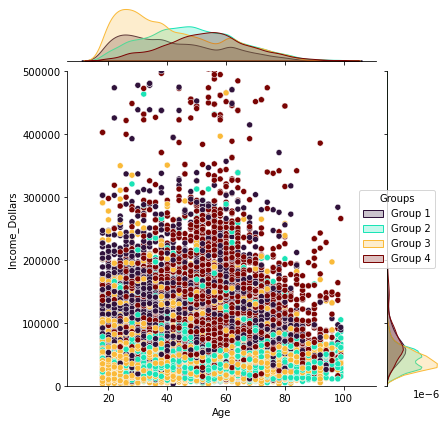

In [56]:
sns.jointplot(x ='Age', y = 'Income_Dollars', hue = 'cluster_labels', palette = 'turbo_r', data = cluster_results, legend = False)
plt.legend(title='Groups', loc='center right', labels=['Group 1', 'Group 2', 'Group 3', 'Group 4'])
plt.ylim(0,500000)

([<matplotlib.axis.YTick at 0x1fd879c3c40>,
 [Text(0, 0, 'Group 1'),
  Text(0, 1, 'Group2'),
  Text(0, 2, 'Group3'),
  Text(0, 3, 'Group 4')])

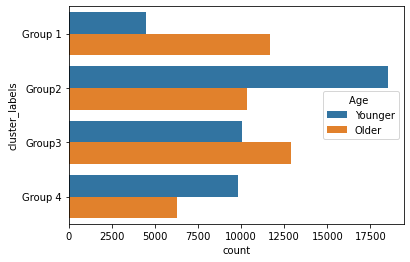

In [57]:
sns.countplot(y = 'cluster_labels', hue = 'Age_Cat', data = cluster_results)
plt.legend(title='Age ', loc='center right', labels=['Younger', 'Older'])
plt.yticks(np.arange(4), ['Group 1', 'Group2', 'Group3','Group 4'])


([<matplotlib.axis.YTick at 0x1fe04851100>,
 [Text(0, 0, 'Group 1'),
  Text(0, 1, 'Group2'),
  Text(0, 2, 'Group3'),
  Text(0, 3, 'Group 4')])

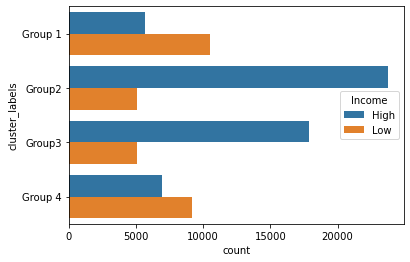

In [58]:
sns.countplot(y = 'cluster_labels', hue = 'Income_Cat', data = cluster_results)
plt.legend(title='Income', loc='center right', labels=['High', 'Low'])
plt.yticks(np.arange(4), ['Group 1', 'Group2', 'Group3','Group 4'])

## The First Group tends to have a high income, and an age above the mean.

## The Second Group tends to have a low income and an age below the mean

## The Third group tends to have a low income and an age above the mean

## The Fourth tends to have a high income and an age below the mean.

 ## Section 3.3 Analyze the clusters by policy

In [59]:
df_MasterQuote

,Unnamed: 0,QuoteNumber,MQuotedTotalPayment,BiFcCoverageInd,CoverageTypeDescription,DriversActive,GaragingState,NamedInsuredMaritalStatus,PolicyNumber,PolicyStateCode,PolicyTerm,QuoteInitiatedTime,TermEffectiveDate,TermExpirationDate,DsDwellingDescription,DsMultiCarDescription,NamedInsuredAge,NamedInsuredDriverPoints,DriverNumber,AbilitecContactID,AbilitecHouseholdID,DriverCount
0,0,MzM0MDA0OTE=,1136.00,BI NOFC,Liability Only,1,OR,Single,T1IyNzE0OTQ0,OR,12,1/2/16 22:25,1/2/16 0:00,1/2/17 0:00,No Dwelling Discount,No Multi-Car Discount,40,0,1,04ZJUS0220X4MKG7,04ZJUS033FV1YJP0,1
1,1,MzM0MDQxNzU=,0.00,NOBI NOFC,Liability Only,1,IL,Divorced,NaN,IL,12,1/3/16 12:15,1/3/16 0:00,1/3/17 0:00,No Dwelling Discount,No Multi-Car Discount,44,0,1,04ZJUS02W4N0B2J5,04ZJUS03543132P3,1
2,2,MzM0MTc2MTk=,1160.00,BI NOFC,Liability Only,2,NV,Married,TlYyNzE2MTE5,NV,12,1/4/16 11:10,1/4/16 0:00,1/4/17 0:00,No Dwelling Discount,No Multi-Car Discount,42,0,1,04ZJUS01KNTMYEQF,04ZJUS03X6MXZ21T,2
3,3,MzM0MTk3MjQ=,3054.00,BI FC,Full Coverage,2,RI,Married,UkkyNzQ3ODg1,RI,12,1/4/16 12:09,1/26/16 0:00,1/26/17 0:00,Homeowner-No Proof Required,Multi-Car Discount,55,0,2,04ZJUS02XQ1DGSDW,04ZJUS03ZDK4PGRF,1
4,4,MzM0MjAxMjU=,0.00,NOBI NOFC,Liability Only,1,OH,Single,NaN,OH,12,1/4/16 12:20,1/4/16 0:00,1/4/17 0:00,No Dwelling Discount,No Multi-Car Discount,39,30,1,04ZJUS023RYMYKKP,04ZJUS036201CX3G,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34970,34970,NjUzODg5NzY=,3452.50,BI FC,Full Coverage,2,MN,Single,NaN,MN,6,5/6/19 14:04,5/6/19 0:00,11/6/19 0:00,Homeowner-Needs Proof(hn),Multi-Car Discount,46,0,1,04ZJUS02MVV5YT0C,04ZJUS03FFTGD3EE,3
34971,34971,NjUzOTE5Mjg=,1235.00,BI NOFC,Liability Only,1,GA,Single,NaN,GA,6,5/6/19 14:56,5/6/19 0:00,11/6/19 0:00,No Dwelling Discount,No Multi-Car Discount,33,0,1,04ZJUS02QK8MJM5F,04ZJUS039Z15ZJLQ,1
34972,34972,NjUzOTI4ODg=,2297.00,BI FC,Full Coverage,1,OK,Single,T0s0NTI4MzMz,OK,12,5/6/19 15:14,5/8/19 0:00,5/8/20 0:00,No Dwelling Discount,No Multi-Car Discount,33,0,1,04ZJUS01PZ3G4PJ5,04ZJUS13H4G2GJMT,1
34973,34973,NjUzOTM3MzQ=,1207.00,BI NOFC,Liability Only,2,KS,Married,NaN,KS,12,5/6/19 15:28,5/29/19 0:00,5/29/20 0:00,No Dwelling Discount,Multi-Car Discount,40,0,1,04ZJUS0169W38WEX,04ZJUS03GSEE695S,4


In [60]:
df_MasterQuote = df_MasterQuote.drop(df_MasterQuote.columns[[0]], axis =1)

In [61]:
df_MasterQuote.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34975 entries, 0 to 34974
Data columns (total 21 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   QuoteNumber                34975 non-null  object 
 1   MQuotedTotalPayment        34975 non-null  float64
 2   BiFcCoverageInd            34975 non-null  object 
 3   CoverageTypeDescription    34975 non-null  object 
 4   DriversActive              34975 non-null  int64  
 5   GaragingState              34975 non-null  object 
 6   NamedInsuredMaritalStatus  34975 non-null  object 
 7   PolicyNumber               21113 non-null  object 
 8   PolicyStateCode            34975 non-null  object 
 9   PolicyTerm                 34975 non-null  int64  
 10  QuoteInitiatedTime         34975 non-null  object 
 11  TermEffectiveDate          34975 non-null  object 
 12  TermExpirationDate         34975 non-null  object 
 13  DsDwellingDescription      34975 non-null  obj

In [62]:
cluster_results_policy = pd.merge(df_MasterQuote,cluster_results, how = 'inner', on = 'AbilitecContactID')

In [63]:
cluster_results_policy

,QuoteNumber,MQuotedTotalPayment,BiFcCoverageInd,CoverageTypeDescription,DriversActive,GaragingState,NamedInsuredMaritalStatus,PolicyNumber,PolicyStateCode,PolicyTerm,QuoteInitiatedTime,TermEffectiveDate,TermExpirationDate,DsDwellingDescription,DsMultiCarDescription,NamedInsuredAge,NamedInsuredDriverPoints,DriverNumber,AbilitecContactID,AbilitecHouseholdID,DriverCount,APID,Income_Dollars,Age,Adults_in_Household,Househoold_Size,Discretionary_Spending_Dollars,Homeowner,Married,Predict_4,Age_Cat,Income_Cat,Household_Cat,cluster_labels,AP005370_Carry_a_Combination_Term_and_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005370,AP005371_Carry_a_Credit_Life_Insurance_Policy_Fin_rank_base_20_AP005371,AP005372_Carry_a_Home_Insurance_Floater_Policy_for_Collections_Fin_rank_base_20_AP005372,AP005373_Carry_a_Home_Insurance_Floater_Policy_for_Jewelry_or_Furs_Fin_rank_base_20_AP005373,AP005374_Carry_a_Home_Insurance_Floater_Policy_or_Additional_Other_Coverage_Fin_rank_base_20_AP005374,AP005375_Carry_a_Separate_Term_Life_Insurance_Policy_Fin_rank_base_20_AP005375,AP005376_Carry_a_Separate_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005376,AP005377_Carry_a_Universal_Life_Insurance_Policy_Fin_rank_base_20_AP005377,AP005370_Carry_a_Combination_Term_and_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005370,AP005371_Carry_a_Credit_Life_Insurance_Policy_Fin_rank_base_20_AP005371,AP005372_Carry_a_Home_Insurance_Floater_Policy_for_Collections_Fin_rank_base_20_AP005372,AP005373_Carry_a_Home_Insurance_Floater_Policy_for_Jewelry_or_Furs_Fin_rank_base_20_AP005373,AP005374_Carry_a_Home_Insurance_Floater_Policy_or_Additional_Other_Coverage_Fin_rank_base_20_AP005374,AP005375_Carry_a_Separate_Term_Life_Insurance_Policy_Fin_rank_base_20_AP005375,AP005376_Carry_a_Separate_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005376,AP005377_Carry_a_Universal_Life_Insurance_Policy_Fin_rank_base_20_AP005377,AP005378_Cigna_Life_Insurance_Fin_rank_base_20_AP005378,AP005379_Farm_Bureau_Life_Insurance_Fin_rank_base_20_AP005379,AP005380_Farmers_Insurance_Group_Life_Insurance_Fin_rank_base_20_AP005380,AP005381_Genworth_Life_Insurance_Fin_rank_base_20_AP005381,AP005382_Gerber_Life_Insurance_Fin_rank_base_20_AP005382,AP005383_Guardian_Life_Insurance_Fin_rank_base_20_AP005383,AP005384_Have_Chubb_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005384,AP005385_Have_Country_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005385,AP005386_Have_Farmers_Insurance_Group_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005386,AP005387_Have_Foremost_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005387,AP005388_Have_Home_Insurance_On_a_Condominium_or_Co_Op_Fin_rank_base_20_AP005388,AP005389_Have_Liberty_Mutual_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005389,AP005390_Have_MetLife_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005390,AP005391_Have_Safeco_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005391,AP005392_Have_the_Hartford_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005392,AP005393_Have_Travelers_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005393,AP005394_ING_Life_Insurance_Fin_rank_base_20_AP005394,AP005395_John_Hancock_Life_Insurance_Fin_rank_base_20_AP005395,AP005396_Lincoln_Financial_Group_Life_Insurance_Fin_rank_base_20_AP005396,AP005397_MassMutual_Life_Insurance_Fin_rank_base_20_AP005397,AP005398_MetLife_Life_Insurance_Fin_rank_base_20_AP005398,AP005399_Mutual_of_Omaha_Life_Insurance_Fin_rank_base_20_AP005399,AP005400_Nationwide_Life_Insurance_Fin_rank_base_20_AP005400,AP005401_New_York_Life_Insurance_Fin_rank_base_20_AP005401,AP005402_Obtain_Accidental_Death_and_Dismemberment_Insurance_Fin_rank_base_20_AP005402,AP005403_Obtain_Boat_Owners_Insurance_Fin_rank_base_20_AP005403,AP005404_Obtain_Business_Insurance_Fin_rank_base_20_AP005404,AP005405_Obtain_Identity_Theft_Insurance_Fin_rank_base_20_AP005405,AP005406_Obtain_Life_Insurance_Along_with_Loan

In [64]:
cluster_results_policy = cluster_results_policy.dropna(subset=['PolicyNumber'])

In [65]:
cluster_results_policy

,QuoteNumber,MQuotedTotalPayment,BiFcCoverageInd,CoverageTypeDescription,DriversActive,GaragingState,NamedInsuredMaritalStatus,PolicyNumber,PolicyStateCode,PolicyTerm,QuoteInitiatedTime,TermEffectiveDate,TermExpirationDate,DsDwellingDescription,DsMultiCarDescription,NamedInsuredAge,NamedInsuredDriverPoints,DriverNumber,AbilitecContactID,AbilitecHouseholdID,DriverCount,APID,Income_Dollars,Age,Adults_in_Household,Househoold_Size,Discretionary_Spending_Dollars,Homeowner,Married,Predict_4,Age_Cat,Income_Cat,Household_Cat,cluster_labels,AP005370_Carry_a_Combination_Term_and_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005370,AP005371_Carry_a_Credit_Life_Insurance_Policy_Fin_rank_base_20_AP005371,AP005372_Carry_a_Home_Insurance_Floater_Policy_for_Collections_Fin_rank_base_20_AP005372,AP005373_Carry_a_Home_Insurance_Floater_Policy_for_Jewelry_or_Furs_Fin_rank_base_20_AP005373,AP005374_Carry_a_Home_Insurance_Floater_Policy_or_Additional_Other_Coverage_Fin_rank_base_20_AP005374,AP005375_Carry_a_Separate_Term_Life_Insurance_Policy_Fin_rank_base_20_AP005375,AP005376_Carry_a_Separate_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005376,AP005377_Carry_a_Universal_Life_Insurance_Policy_Fin_rank_base_20_AP005377,AP005370_Carry_a_Combination_Term_and_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005370,AP005371_Carry_a_Credit_Life_Insurance_Policy_Fin_rank_base_20_AP005371,AP005372_Carry_a_Home_Insurance_Floater_Policy_for_Collections_Fin_rank_base_20_AP005372,AP005373_Carry_a_Home_Insurance_Floater_Policy_for_Jewelry_or_Furs_Fin_rank_base_20_AP005373,AP005374_Carry_a_Home_Insurance_Floater_Policy_or_Additional_Other_Coverage_Fin_rank_base_20_AP005374,AP005375_Carry_a_Separate_Term_Life_Insurance_Policy_Fin_rank_base_20_AP005375,AP005376_Carry_a_Separate_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005376,AP005377_Carry_a_Universal_Life_Insurance_Policy_Fin_rank_base_20_AP005377,AP005378_Cigna_Life_Insurance_Fin_rank_base_20_AP005378,AP005379_Farm_Bureau_Life_Insurance_Fin_rank_base_20_AP005379,AP005380_Farmers_Insurance_Group_Life_Insurance_Fin_rank_base_20_AP005380,AP005381_Genworth_Life_Insurance_Fin_rank_base_20_AP005381,AP005382_Gerber_Life_Insurance_Fin_rank_base_20_AP005382,AP005383_Guardian_Life_Insurance_Fin_rank_base_20_AP005383,AP005384_Have_Chubb_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005384,AP005385_Have_Country_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005385,AP005386_Have_Farmers_Insurance_Group_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005386,AP005387_Have_Foremost_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005387,AP005388_Have_Home_Insurance_On_a_Condominium_or_Co_Op_Fin_rank_base_20_AP005388,AP005389_Have_Liberty_Mutual_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005389,AP005390_Have_MetLife_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005390,AP005391_Have_Safeco_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005391,AP005392_Have_the_Hartford_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005392,AP005393_Have_Travelers_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005393,AP005394_ING_Life_Insurance_Fin_rank_base_20_AP005394,AP005395_John_Hancock_Life_Insurance_Fin_rank_base_20_AP005395,AP005396_Lincoln_Financial_Group_Life_Insurance_Fin_rank_base_20_AP005396,AP005397_MassMutual_Life_Insurance_Fin_rank_base_20_AP005397,AP005398_MetLife_Life_Insurance_Fin_rank_base_20_AP005398,AP005399_Mutual_of_Omaha_Life_Insurance_Fin_rank_base_20_AP005399,AP005400_Nationwide_Life_Insurance_Fin_rank_base_20_AP005400,AP005401_New_York_Life_Insurance_Fin_rank_base_20_AP005401,AP005402_Obtain_Accidental_Death_and_Dismemberment_Insurance_Fin_rank_base_20_AP005402,AP005403_Obtain_Boat_Owners_Insurance_Fin_rank_base_20_AP005403,AP005404_Obtain_Business_Insurance_Fin_rank_base_20_AP005404,AP005405_Obtain_Identity_Theft_Insurance_Fin_rank_base_20_AP005405,AP005406_Obtain_Life_Insurance_Along_with_Loan

In [66]:
cluster_results_policy.groupby('cluster_labels')['MQuotedTotalPayment'].median()

cluster_labels
0    1361.0
1    1325.0
2    1257.0
3    1392.0
Name: MQuotedTotalPayment, dtype: float64

## 1st Group High Income and older  had the second highest median quote at 1361.0 dollars

## 2nd Group Low Income and younger had the 3rd largest median quote at 1325.0 dollars

## 3rd group Low Income and older had the lowest median quote 1257.0 dollars

## 4th group high Income and older had the highest median quote at 1392.0 dollars

In [67]:
def CoverageTypeDescription(c):
  if c['CoverageTypeDescription'] == "Liability Only":
    return 1
  else: 
    return 2

cluster_results_policy['CoverageTypeDescription'] = cluster_results_policy.apply(CoverageTypeDescription, axis=1)

In [68]:
cluster_results_policy

,QuoteNumber,MQuotedTotalPayment,BiFcCoverageInd,CoverageTypeDescription,DriversActive,GaragingState,NamedInsuredMaritalStatus,PolicyNumber,PolicyStateCode,PolicyTerm,QuoteInitiatedTime,TermEffectiveDate,TermExpirationDate,DsDwellingDescription,DsMultiCarDescription,NamedInsuredAge,NamedInsuredDriverPoints,DriverNumber,AbilitecContactID,AbilitecHouseholdID,DriverCount,APID,Income_Dollars,Age,Adults_in_Household,Househoold_Size,Discretionary_Spending_Dollars,Homeowner,Married,Predict_4,Age_Cat,Income_Cat,Household_Cat,cluster_labels,AP005370_Carry_a_Combination_Term_and_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005370,AP005371_Carry_a_Credit_Life_Insurance_Policy_Fin_rank_base_20_AP005371,AP005372_Carry_a_Home_Insurance_Floater_Policy_for_Collections_Fin_rank_base_20_AP005372,AP005373_Carry_a_Home_Insurance_Floater_Policy_for_Jewelry_or_Furs_Fin_rank_base_20_AP005373,AP005374_Carry_a_Home_Insurance_Floater_Policy_or_Additional_Other_Coverage_Fin_rank_base_20_AP005374,AP005375_Carry_a_Separate_Term_Life_Insurance_Policy_Fin_rank_base_20_AP005375,AP005376_Carry_a_Separate_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005376,AP005377_Carry_a_Universal_Life_Insurance_Policy_Fin_rank_base_20_AP005377,AP005370_Carry_a_Combination_Term_and_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005370,AP005371_Carry_a_Credit_Life_Insurance_Policy_Fin_rank_base_20_AP005371,AP005372_Carry_a_Home_Insurance_Floater_Policy_for_Collections_Fin_rank_base_20_AP005372,AP005373_Carry_a_Home_Insurance_Floater_Policy_for_Jewelry_or_Furs_Fin_rank_base_20_AP005373,AP005374_Carry_a_Home_Insurance_Floater_Policy_or_Additional_Other_Coverage_Fin_rank_base_20_AP005374,AP005375_Carry_a_Separate_Term_Life_Insurance_Policy_Fin_rank_base_20_AP005375,AP005376_Carry_a_Separate_Whole_Life_Insurance_Policy_Fin_rank_base_20_AP005376,AP005377_Carry_a_Universal_Life_Insurance_Policy_Fin_rank_base_20_AP005377,AP005378_Cigna_Life_Insurance_Fin_rank_base_20_AP005378,AP005379_Farm_Bureau_Life_Insurance_Fin_rank_base_20_AP005379,AP005380_Farmers_Insurance_Group_Life_Insurance_Fin_rank_base_20_AP005380,AP005381_Genworth_Life_Insurance_Fin_rank_base_20_AP005381,AP005382_Gerber_Life_Insurance_Fin_rank_base_20_AP005382,AP005383_Guardian_Life_Insurance_Fin_rank_base_20_AP005383,AP005384_Have_Chubb_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005384,AP005385_Have_Country_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005385,AP005386_Have_Farmers_Insurance_Group_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005386,AP005387_Have_Foremost_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005387,AP005388_Have_Home_Insurance_On_a_Condominium_or_Co_Op_Fin_rank_base_20_AP005388,AP005389_Have_Liberty_Mutual_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005389,AP005390_Have_MetLife_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005390,AP005391_Have_Safeco_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005391,AP005392_Have_the_Hartford_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005392,AP005393_Have_Travelers_Homeowner_or_Personal_Property_Insurance_Fin_rank_base_20_AP005393,AP005394_ING_Life_Insurance_Fin_rank_base_20_AP005394,AP005395_John_Hancock_Life_Insurance_Fin_rank_base_20_AP005395,AP005396_Lincoln_Financial_Group_Life_Insurance_Fin_rank_base_20_AP005396,AP005397_MassMutual_Life_Insurance_Fin_rank_base_20_AP005397,AP005398_MetLife_Life_Insurance_Fin_rank_base_20_AP005398,AP005399_Mutual_of_Omaha_Life_Insurance_Fin_rank_base_20_AP005399,AP005400_Nationwide_Life_Insurance_Fin_rank_base_20_AP005400,AP005401_New_York_Life_Insurance_Fin_rank_base_20_AP005401,AP005402_Obtain_Accidental_Death_and_Dismemberment_Insurance_Fin_rank_base_20_AP005402,AP005403_Obtain_Boat_Owners_Insurance_Fin_rank_base_20_AP005403,AP005404_Obtain_Business_Insurance_Fin_rank_base_20_AP005404,AP005405_Obtain_Identity_Theft_Insurance_Fin_rank_base_20_AP005405,AP005406_Obtain_Life_Insurance_Along_with_Loan

([<matplotlib.axis.YTick at 0x1fd9faf4f10>,
 [Text(0, 0, 'Group 1'),
  Text(0, 1, 'Group2'),
  Text(0, 2, 'Group3'),
  Text(0, 3, 'Group 4')])

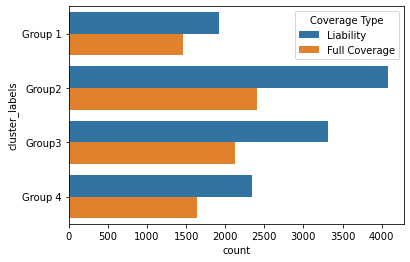

In [69]:
sns.countplot(y = 'cluster_labels', hue = 'CoverageTypeDescription', data = cluster_results_policy)
plt.legend(title='Coverage Type', loc ='upper right', labels=['Liability', 'Full Coverage'])
plt.yticks(np.arange(4), ['Group 1', 'Group2', 'Group3','Group 4'])

## Summary of Cluster Analysis

## Potential and current policy holders can be divided into one of 4 groups with inhousse and abilitech data.
## Group 1 High Income, older: median quote at 1361.0 dollars, higher proportion of full coverage than low income

## Group 2 Low Income, younger: median quote at 1325.0 dollars , lower proportion of full coverage than high income groups

## Group 3 Low Income, older median quote 1257.0 dollars, lower proportion of full coverage than high income groups

## Group 4 High Income, median quote at 1392.0 dollars, younger higher proportion of full coverage than low income


#  XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

## Section 4 Modeling for predicting the MQuotedTotalPayment

## Section 4.1 Feature Selection, Data Cleansing, and Data Transformation

In [70]:
df_predict_MasterQuote = df_MasterQuote[['AbilitecContactID','DriversActive', 'CoverageTypeDescription','NamedInsuredAge','NamedInsuredDriverPoints','PolicyTerm','MQuotedTotalPayment']]

In [71]:
df_predict_MasterQuote

,AbilitecContactID,DriversActive,CoverageTypeDescription,NamedInsuredAge,NamedInsuredDriverPoints,PolicyTerm,MQuotedTotalPayment
0,04ZJUS0220X4MKG7,1,Liability Only,40,0,12,1136.00
1,04ZJUS02W4N0B2J5,1,Liability Only,44,0,12,0.00
2,04ZJUS01KNTMYEQF,2,Liability Only,42,0,12,1160.00
3,04ZJUS02XQ1DGSDW,2,Full Coverage,55,0,12,3054.00
4,04ZJUS023RYMYKKP,1,Liability Only,39,30,12,0.00
...,...,...,...,...,...,...,...
34970,04ZJUS02MVV5YT0C,2,Full Coverage,46,0,6,3452.50
34971,04ZJUS02QK8MJM5F,1,Liability Only,33,0,6,1235.00
34972,04ZJUS01PZ3G4PJ5,1,Full Coverage,33,0,12,2297.00
34973,04ZJUS0169W38WEX,2,Liability Only,40,0,12,1207.00


In [72]:
def CoverageTypeDescription(c):
  if c['CoverageTypeDescription'] == "Liability Only":
    return 1
  else: 
    return 2

df_predict_MasterQuote['CoverageTypeDescription'] = df_predict_MasterQuote.apply(CoverageTypeDescription, axis=1)

In [73]:
df_predict_MasterQuote

,AbilitecContactID,DriversActive,CoverageTypeDescription,NamedInsuredAge,NamedInsuredDriverPoints,PolicyTerm,MQuotedTotalPayment
0,04ZJUS0220X4MKG7,1,1,40,0,12,1136.00
1,04ZJUS02W4N0B2J5,1,1,44,0,12,0.00
2,04ZJUS01KNTMYEQF,2,1,42,0,12,1160.00
3,04ZJUS02XQ1DGSDW,2,2,55,0,12,3054.00
4,04ZJUS023RYMYKKP,1,1,39,30,12,0.00
...,...,...,...,...,...,...,...
34970,04ZJUS02MVV5YT0C,2,2,46,0,6,3452.50
34971,04ZJUS02QK8MJM5F,1,1,33,0,6,1235.00
34972,04ZJUS01PZ3G4PJ5,1,2,33,0,12,2297.00
34973,04ZJUS0169W38WEX,2,1,40,0,12,1207.00


In [74]:
df_state_dummies = df_MasterQuote[['GaragingState']]

In [75]:
df_state_dummies = pd.get_dummies(df_state_dummies)
df_state_dummies

,GaragingState_AK,GaragingState_AL,GaragingState_AR,GaragingState_AZ,GaragingState_CA,GaragingState_CO,GaragingState_CT,GaragingState_DC,GaragingState_DE,GaragingState_FL,GaragingState_GA,GaragingState_IA,GaragingState_ID,GaragingState_IL,GaragingState_IN,GaragingState_KS,GaragingState_KY,GaragingState_LA,GaragingState_MD,GaragingState_ME,GaragingState_MN,GaragingState_MO,GaragingState_MS,GaragingState_MT,GaragingState_NC,GaragingState_ND,GaragingState_NE,GaragingState_NH,GaragingState_NM,GaragingState_NV,GaragingState_NY,GaragingState_OH,GaragingState_OK,GaragingState_OR,GaragingState_PA,GaragingState_RI,GaragingState_SC,GaragingState_SD,GaragingState_TN,GaragingState_TX,GaragingState_UT,GaragingState_VA,GaragingState_VT,GaragingState_WA,GaragingState_WI,GaragingState_WV,GaragingState_WY
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34970,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
34971,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
34972,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
34973,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [76]:
df_predict_MasterQuote = pd.concat([df_predict_MasterQuote, df_state_dummies], axis=1)
df_predict_MasterQuote

,AbilitecContactID,DriversActive,CoverageTypeDescription,NamedInsuredAge,NamedInsuredDriverPoints,PolicyTerm,MQuotedTotalPayment,GaragingState_AK,GaragingState_AL,GaragingState_AR,GaragingState_AZ,GaragingState_CA,GaragingState_CO,GaragingState_CT,GaragingState_DC,GaragingState_DE,GaragingState_FL,GaragingState_GA,GaragingState_IA,GaragingState_ID,GaragingState_IL,GaragingState_IN,GaragingState_KS,GaragingState_KY,GaragingState_LA,GaragingState_MD,GaragingState_ME,GaragingState_MN,GaragingState_MO,GaragingState_MS,GaragingState_MT,GaragingState_NC,GaragingState_ND,GaragingState_NE,GaragingState_NH,GaragingState_NM,GaragingState_NV,GaragingState_NY,GaragingState_OH,GaragingState_OK,GaragingState_OR,GaragingState_PA,GaragingState_RI,GaragingState_SC,GaragingState_SD,GaragingState_TN,GaragingState_TX,GaragingState_UT,GaragingState_VA,GaragingState_VT,GaragingState_WA,GaragingState_WI,GaragingState_WV,GaragingState_WY
0,04ZJUS0220X4MKG7,1,1,40,0,12,1136.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
1,04ZJUS02W4N0B2J5,1,1,44,0,12,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,04ZJUS01KNTMYEQF,2,1,42,0,12,1160.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,04ZJUS02XQ1DGSDW,2,2,55,0,12,3054.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
4,04ZJUS023RYMYKKP,1,1,39,30,12,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34970,04ZJUS02MVV5YT0C,2,2,46,0,6,3452.50,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
34971,04ZJUS02QK8MJM5F,1,1,33,0,6,1235.00,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
34972,04ZJUS01PZ3G4PJ5,1,2,33,0,12,2297.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
34973,04ZJUS0169W38WEX,2,1,40,0,12,1207.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [77]:
df_Abilitech_list7 = df_Abilitech_columns[df_Abilitech_columns['ColumnName'].str.contains('Acquired')]

In [78]:
df_Abilitech_list8 = df_Abilitech_columns[df_Abilitech_columns['ColumnName'].str.contains('Purchase_a_Major_Appliance')]

In [79]:
df_Abilitech_list9 = df_Abilitech_columns[df_Abilitech_columns['ColumnName'].str.contains('Obtain_Business_Insurance')]

In [80]:
df_Abilitech_list10 = df_Abilitech_columns[df_Abilitech_columns['ColumnName'].str.contains('Contribute_to')]

In [81]:
df_Abilitech_list11 = df_Abilitech_columns[df_Abilitech_columns['ColumnName'].str.contains('Have_Met_with_a_Financial_Planner')]

In [82]:
df_predict_Abilitech = pd.concat([df_Abilitech_list7, df_Abilitech_list8, df_Abilitech_list9,df_Abilitech_list10, df_Abilitech_list11], axis=0)
df_predict_Abilitech = pd.DataFrame(df_predict_Abilitech)


In [83]:
var2_Abilitech = df_predict_Abilitech['ColumnName']

In [84]:
df_predict_Abilitech = df_Abilitech[var2_Abilitech]
df_predict_Abilitech

,AP005426_Acquired_Common_Stock_in_Any_Company_in_the_Last_Twelve_Months_Fin_rank_base_20_AP005426,AP005427_Acquired_US_Savings_Bonds_in_the_Last_Twelve_Months_Fin_rank_base_20_AP005427,AP005428_Annuities_Acquired_in_the_Last_Twelve_Months_Fin_rank_base_20_AP005428,AP005555_Purchase_a_Major_Appliance_from_Lowes_Fin_rank_base_20_AP005555,AP005404_Obtain_Business_Insurance_Fin_rank_base_20_AP005404,AP005454_Contribute_to_a_Non_Religious_Organization_Fin_rank_base_20_AP005454,AP005455_Contribute_to_a_Religious_Organization_Fin_rank_base_20_AP005455,AP005456_Contribute_to_National_Public_Radio_Fin_rank_base_20_AP005456,AP005457_Contribute_to_Public_Broadcasting_Service_Fin_rank_base_20_AP005457,AP005446_Have_Met_with_a_Financial_Planner_Fin_rank_base_20_AP005446
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,15.0,8.0,8.0,4.0,13.0,6.0,4.0,10.0,10.0,10.0
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,7.0,6.0,4.0,2.0,2.0,10.0,9.0,17.0,15.0,9.0
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
96496,14.0,19.0,6.0,8.0,12.0,7.0,2.0,10.0,12.0,9.0
96497,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
96498,15.0,6.0,1.0,4.0,17.0,15.0,17.0,13.0,18.0,15.0
96499,19.0,4.0,14.0,12.0,18.0,15.0,10.0,12.0,8.0,17.0


In [85]:
df_predict_Abilitech = pd.concat([df_Abilitech_ID,df_predict_Abilitech],axis = 1)
df_predict_Abilitech

,AbilitecContactID,AP005426_Acquired_Common_Stock_in_Any_Company_in_the_Last_Twelve_Months_Fin_rank_base_20_AP005426,AP005427_Acquired_US_Savings_Bonds_in_the_Last_Twelve_Months_Fin_rank_base_20_AP005427,AP005428_Annuities_Acquired_in_the_Last_Twelve_Months_Fin_rank_base_20_AP005428,AP005555_Purchase_a_Major_Appliance_from_Lowes_Fin_rank_base_20_AP005555,AP005404_Obtain_Business_Insurance_Fin_rank_base_20_AP005404,AP005454_Contribute_to_a_Non_Religious_Organization_Fin_rank_base_20_AP005454,AP005455_Contribute_to_a_Religious_Organization_Fin_rank_base_20_AP005455,AP005456_Contribute_to_National_Public_Radio_Fin_rank_base_20_AP005456,AP005457_Contribute_to_Public_Broadcasting_Service_Fin_rank_base_20_AP005457,AP005446_Have_Met_with_a_Financial_Planner_Fin_rank_base_20_AP005446
0,04ZJUS11ZZY02CX2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,04ZJUS11ZZX6Z5PH,15.0,8.0,8.0,4.0,13.0,6.0,4.0,10.0,10.0,10.0
2,04ZJUS11ZZVK414Y,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,04ZJUS11ZZV842QB,7.0,6.0,4.0,2.0,2.0,10.0,9.0,17.0,15.0,9.0
4,04ZJUS11ZZTVWBDL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
96496,04ZJUS010026YQKY,14.0,19.0,6.0,8.0,12.0,7.0,2.0,10.0,12.0,9.0
96497,04ZJUS0100206EF3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
96498,04ZJUS010015G63F,15.0,6.0,1.0,4.0,17.0,15.0,17.0,13.0,18.0,15.0
96499,04ZJUS01000GDG9V,19.0,4.0,14.0,12.0,18.0,15.0,10.0,12.0,8.0,17.0


In [86]:
df_predict_Abilitech = df_predict_Abilitech.dropna(axis =0, how = 'all', thresh = 5)
df_predict_Abilitech

,AbilitecContactID,AP005426_Acquired_Common_Stock_in_Any_Company_in_the_Last_Twelve_Months_Fin_rank_base_20_AP005426,AP005427_Acquired_US_Savings_Bonds_in_the_Last_Twelve_Months_Fin_rank_base_20_AP005427,AP005428_Annuities_Acquired_in_the_Last_Twelve_Months_Fin_rank_base_20_AP005428,AP005555_Purchase_a_Major_Appliance_from_Lowes_Fin_rank_base_20_AP005555,AP005404_Obtain_Business_Insurance_Fin_rank_base_20_AP005404,AP005454_Contribute_to_a_Non_Religious_Organization_Fin_rank_base_20_AP005454,AP005455_Contribute_to_a_Religious_Organization_Fin_rank_base_20_AP005455,AP005456_Contribute_to_National_Public_Radio_Fin_rank_base_20_AP005456,AP005457_Contribute_to_Public_Broadcasting_Service_Fin_rank_base_20_AP005457,AP005446_Have_Met_with_a_Financial_Planner_Fin_rank_base_20_AP005446
1,04ZJUS11ZZX6Z5PH,15.0,8.0,8.0,4.0,13.0,6.0,4.0,10.0,10.0,10.0
3,04ZJUS11ZZV842QB,7.0,6.0,4.0,2.0,2.0,10.0,9.0,17.0,15.0,9.0
6,04ZJUS11ZZT1XXYJ,14.0,7.0,14.0,16.0,10.0,2.0,6.0,3.0,3.0,7.0
9,04ZJUS11ZZPV93BL,18.0,19.0,20.0,15.0,9.0,13.0,16.0,9.0,15.0,17.0
10,04ZJUS11ZZPDGK4D,15.0,17.0,16.0,10.0,18.0,16.0,18.0,10.0,12.0,15.0
...,...,...,...,...,...,...,...,...,...,...,...
96495,04ZJUS01002HM3NF,9.0,16.0,6.0,12.0,8.0,16.0,8.0,12.0,19.0,10.0
96496,04ZJUS010026YQKY,14.0,19.0,6.0,8.0,12.0,7.0,2.0,10.0,12.0,9.0
96498,04ZJUS010015G63F,15.0,6.0,1.0,4.0,17.0,15.0,17.0,13.0,18.0,15.0
96499,04ZJUS01000GDG9V,19.0,4.0,14.0,12.0,18.0,15.0,10.0,12.0,8.0,17.0


In [87]:
df_predict_MasterQuote = pd.merge(df_predict_MasterQuote,df_predict_Abilitech, how = 'inner', on = 'AbilitecContactID')
df_predict_MasterQuote

,AbilitecContactID,DriversActive,CoverageTypeDescription,NamedInsuredAge,NamedInsuredDriverPoints,PolicyTerm,MQuotedTotalPayment,GaragingState_AK,GaragingState_AL,GaragingState_AR,GaragingState_AZ,GaragingState_CA,GaragingState_CO,GaragingState_CT,GaragingState_DC,GaragingState_DE,GaragingState_FL,GaragingState_GA,GaragingState_IA,GaragingState_ID,GaragingState_IL,GaragingState_IN,GaragingState_KS,GaragingState_KY,GaragingState_LA,GaragingState_MD,GaragingState_ME,GaragingState_MN,GaragingState_MO,GaragingState_MS,GaragingState_MT,GaragingState_NC,GaragingState_ND,GaragingState_NE,GaragingState_NH,GaragingState_NM,GaragingState_NV,GaragingState_NY,GaragingState_OH,GaragingState_OK,GaragingState_OR,GaragingState_PA,GaragingState_RI,GaragingState_SC,GaragingState_SD,GaragingState_TN,GaragingState_TX,GaragingState_UT,GaragingState_VA,GaragingState_VT,GaragingState_WA,GaragingState_WI,GaragingState_WV,GaragingState_WY,AP005426_Acquired_Common_Stock_in_Any_Company_in_the_Last_Twelve_Months_Fin_rank_base_20_AP005426,AP005427_Acquired_US_Savings_Bonds_in_the_Last_Twelve_Months_Fin_rank_base_20_AP005427,AP005428_Annuities_Acquired_in_the_Last_Twelve_Months_Fin_rank_base_20_AP005428,AP005555_Purchase_a_Major_Appliance_from_Lowes_Fin_rank_base_20_AP005555,AP005404_Obtain_Business_Insurance_Fin_rank_base_20_AP005404,AP005454_Contribute_to_a_Non_Religious_Organization_Fin_rank_base_20_AP005454,AP005455_Contribute_to_a_Religious_Organization_Fin_rank_base_20_AP005455,AP005456_Contribute_to_National_Public_Radio_Fin_rank_base_20_AP005456,AP005457_Contribute_to_Public_Broadcasting_Service_Fin_rank_base_20_AP005457,AP005446_Have_Met_with_a_Financial_Planner_Fin_rank_base_20_AP005446
0,04ZJUS0220X4MKG7,1,1,40,0,12,1136.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,17.0,20.0,2.0,13.0,15.0,10.0,12.0,12.0,18.0,11.0
1,04ZJUS02W4N0B2J5,1,1,44,0,12,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,19.0,8.0,9.0,19.0,15.0,18.0,17.0,18.0,18.0,14.0
2,04ZJUS02W4N0B2J5,1,1,44,1,12,639.00,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,19.0,8.0,9.0,19.0,15.0,18.0,17.0,18.0,18.0,14.0
3,04ZJUS01KNTMYEQF,2,1,42,0,12,1160.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,18.0,19.0,19.0,20.0,19.0,19.0,20.0,16.0,15.0,18.0
4,04ZJUS01KNTMYEQF,2,1,43,0,12,1586.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,18.0,19.0,19.0,20.0,19.0,19.0,20.0,16.0,15.0,18.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32117,04ZJUS02BKZ8K29X,1,1,38,16,12,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,8.0,14.0,8.0,14.0,19.0,12.0,11.0,13.0,13.0,16.0
32118,04ZJUS01EDNDGKRY,1,1,29,0,12,970.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,9.0,18.0,20.0,3.0,17.0,13.0,13.0,14.0,12.0,10.0
32119,04ZJUS01EDNDGKRY,1,1,29,0,6,414.00,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,9.0,18.0,20.0,3.0,17.0,13.0,13.0,14.0,12.0,10.0
32120,04ZJUS02MVKR4CEC,1,1,48,0,12,941.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,14.0,10.0,11.0,2.0,9.0,14.0,14.0,13.0,19.0,15.0


In [88]:
df_predict_MasterQuote =  df_predict_MasterQuote.drop(columns = 'AbilitecContactID')

In [89]:
df_predict_MasterQuote

,DriversActive,CoverageTypeDescription,NamedInsuredAge,NamedInsuredDriverPoints,PolicyTerm,MQuotedTotalPayment,GaragingState_AK,GaragingState_AL,GaragingState_AR,GaragingState_AZ,GaragingState_CA,GaragingState_CO,GaragingState_CT,GaragingState_DC,GaragingState_DE,GaragingState_FL,GaragingState_GA,GaragingState_IA,GaragingState_ID,GaragingState_IL,GaragingState_IN,GaragingState_KS,GaragingState_KY,GaragingState_LA,GaragingState_MD,GaragingState_ME,GaragingState_MN,GaragingState_MO,GaragingState_MS,GaragingState_MT,GaragingState_NC,GaragingState_ND,GaragingState_NE,GaragingState_NH,GaragingState_NM,GaragingState_NV,GaragingState_NY,GaragingState_OH,GaragingState_OK,GaragingState_OR,GaragingState_PA,GaragingState_RI,GaragingState_SC,GaragingState_SD,GaragingState_TN,GaragingState_TX,GaragingState_UT,GaragingState_VA,GaragingState_VT,GaragingState_WA,GaragingState_WI,GaragingState_WV,GaragingState_WY,AP005426_Acquired_Common_Stock_in_Any_Company_in_the_Last_Twelve_Months_Fin_rank_base_20_AP005426,AP005427_Acquired_US_Savings_Bonds_in_the_Last_Twelve_Months_Fin_rank_base_20_AP005427,AP005428_Annuities_Acquired_in_the_Last_Twelve_Months_Fin_rank_base_20_AP005428,AP005555_Purchase_a_Major_Appliance_from_Lowes_Fin_rank_base_20_AP005555,AP005404_Obtain_Business_Insurance_Fin_rank_base_20_AP005404,AP005454_Contribute_to_a_Non_Religious_Organization_Fin_rank_base_20_AP005454,AP005455_Contribute_to_a_Religious_Organization_Fin_rank_base_20_AP005455,AP005456_Contribute_to_National_Public_Radio_Fin_rank_base_20_AP005456,AP005457_Contribute_to_Public_Broadcasting_Service_Fin_rank_base_20_AP005457,AP005446_Have_Met_with_a_Financial_Planner_Fin_rank_base_20_AP005446
0,1,1,40,0,12,1136.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,17.0,20.0,2.0,13.0,15.0,10.0,12.0,12.0,18.0,11.0
1,1,1,44,0,12,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,19.0,8.0,9.0,19.0,15.0,18.0,17.0,18.0,18.0,14.0
2,1,1,44,1,12,639.00,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,19.0,8.0,9.0,19.0,15.0,18.0,17.0,18.0,18.0,14.0
3,2,1,42,0,12,1160.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,18.0,19.0,19.0,20.0,19.0,19.0,20.0,16.0,15.0,18.0
4,2,1,43,0,12,1586.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,18.0,19.0,19.0,20.0,19.0,19.0,20.0,16.0,15.0,18.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32117,1,1,38,16,12,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,8.0,14.0,8.0,14.0,19.0,12.0,11.0,13.0,13.0,16.0
32118,1,1,29,0,12,970.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,9.0,18.0,20.0,3.0,17.0,13.0,13.0,14.0,12.0,10.0
32119,1,1,29,0,6,414.00,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,9.0,18.0,20.0,3.0,17.0,13.0,13.0,14.0,12.0,10.0
32120,1,1,48,0,12,941.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,14.0,10.0,11.0,2.0,9.0,14.0,14.0,13.0,19.0,15.0


## Section 4.2 Running a Lasso Regrassion Model to find the most important features in predicting MQuotedTotalPayment.

In [90]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Lasso, Ridge
import statsmodels
import statsmodels.api as sm
import statsmodels.formula.api as smf

In [91]:
 X = df_predict_MasterQuote.drop(columns = ['MQuotedTotalPayment'])

In [92]:
y = df_predict_MasterQuote['MQuotedTotalPayment']
y = y.values.reshape(-1, 1)

In [93]:
scaler = StandardScaler() 
X_reg_scaled = scaler.fit_transform(X)

In [94]:
X_train, X_test, y_train, y_test = train_test_split(X_reg_scaled, y, test_size = 0.3, random_state = 38)

iteration 0.1 done
iteration 0.5 done
iteration 1 done
iteration 5 done
iteration 10 done
iteration 25 done
iteration 50 done


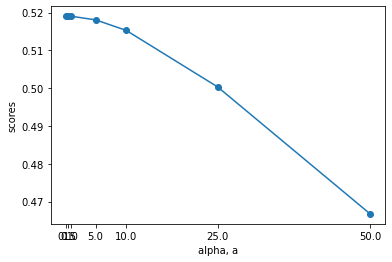

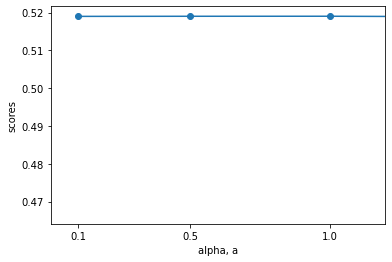

In [95]:
alphas = [0.1, 0.5, 1, 5, 10, 25, 50]
scores = []
for a in alphas:
    lasso = Lasso(alpha = a)
    lasso.fit(X_train, y_train)
    scores.append(lasso.score(X_test, y_test))
    print ("iteration {} done".format(a))
    
plt.plot(alphas, scores, '-o')
plt.xlabel('alpha, a')
plt.ylabel('scores')
plt.xticks(alphas)
plt.show()
plt.plot(alphas, scores, '-o')
plt.xlabel('alpha, a')
plt.ylabel('scores')
plt.xticks(alphas)
plt.xlim(0, 1.2)
plt.show()



In [96]:
lasso = Lasso(alpha=1, normalize=False)

In [97]:
lasso.fit(X_train, y_train) 

Lasso(alpha=1)

In [98]:
 lasso_pred = lasso.predict(X_test) 

In [99]:
lasso.score(X_test, y_test)

0.5190298033024956

In [100]:
names = X.columns

In [101]:
df_names = pd.DataFrame(names)
df_names = df_names.rename(columns = {0:'Features'})

In [102]:
lasso_coef = lasso.fit(X, y).coef_

In [103]:
df_lasso_coef = pd.DataFrame(lasso_coef)
df_lasso_coef = df_lasso_coef.rename(columns = {0:'Coefficient'})
df_lasso_coef

,Coefficient
0,319.891301
1,1205.690986
2,-10.409160
3,94.422164
4,137.228224
5,-0.000000
6,-105.202290
7,81.002026
8,0.000000
9,-509.680018


In [104]:
df_lasso = pd.concat([df_lasso_coef, df_names], axis = 1)
df_lasso

,Coefficient,Features
0,319.891301,DriversActive
1,1205.690986,CoverageTypeDescription
2,-10.409160,NamedInsuredAge
3,94.422164,NamedInsuredDriverPoints
4,137.228224,PolicyTerm
5,-0.000000,GaragingState_AK
6,-105.202290,GaragingState_AL
7,81.002026,GaragingState_AR
8,0.000000,GaragingState_AZ
9,-509.680018,GaragingState_CA


In [105]:
df_lasso_sig = df_lasso[df_lasso['Coefficient']!=0]
df_lasso_sig

,Coefficient,Features
0,319.891301,DriversActive
1,1205.690986,CoverageTypeDescription
2,-10.409160,NamedInsuredAge
3,94.422164,NamedInsuredDriverPoints
4,137.228224,PolicyTerm
6,-105.202290,GaragingState_AL
7,81.002026,GaragingState_AR
9,-509.680018,GaragingState_CA
10,121.926996,GaragingState_CO
11,745.691793,GaragingState_CT


In [106]:
df_lasso_sig.sort_values('Coefficient', ascending = False)

,Coefficient,Features
1,1205.690986,CoverageTypeDescription
13,1089.888697,GaragingState_DE
14,922.430906,GaragingState_FL
21,754.294273,GaragingState_KY
11,745.691793,GaragingState_CT
41,618.772589,GaragingState_SC
12,493.133703,GaragingState_DC
22,492.528884,GaragingState_LA
15,471.064094,GaragingState_GA
38,437.547341,GaragingState_OR


## Section 4.3 Run a predictive model to predict MQuotedTotalPayment with all the features using Ridge Regression

In [107]:
ridge = Ridge(alpha=100, normalize=False) 

In [108]:
ridge.fit(X_train, y_train)

Ridge(alpha=100)

In [109]:
ridge_preds = ridge.predict(X_test)

In [110]:
 ridge.score(X_test, y_test) 

0.5189392707777674

In [111]:
names_ridge = X.columns

In [112]:
names_ridge

Index(['DriversActive', 'CoverageTypeDescription', 'NamedInsuredAge',
       'NamedInsuredDriverPoints', 'PolicyTerm', 'GaragingState_AK',
       'GaragingState_AL', 'GaragingState_AR', 'GaragingState_AZ',
       'GaragingState_CA', 'GaragingState_CO', 'GaragingState_CT',
       'GaragingState_DC', 'GaragingState_DE', 'GaragingState_FL',
       'GaragingState_GA', 'GaragingState_IA', 'GaragingState_ID',
       'GaragingState_IL', 'GaragingState_IN', 'GaragingState_KS',
       'GaragingState_KY', 'GaragingState_LA', 'GaragingState_MD',
       'GaragingState_ME', 'GaragingState_MN', 'GaragingState_MO',
       'GaragingState_MS', 'GaragingState_MT', 'GaragingState_NC',
       'GaragingState_ND', 'GaragingState_NE', 'GaragingState_NH',
       'GaragingState_NM', 'GaragingState_NV', 'GaragingState_NY',
       'GaragingState_OH', 'GaragingState_OK', 'GaragingState_OR',
       'GaragingState_PA', 'GaragingState_RI', 'GaragingState_SC',
       'GaragingState_SD', 'GaragingState_TN', 'GaragingS

In [113]:
ridge_coef = ridge.fit(X, y).coef_

In [114]:
ridge_coef

array([[ 3.18658447e+02,  1.19526811e+03, -1.03554392e+01,
         9.46908342e+01,  1.37665216e+02, -9.71540747e+01,
        -2.09591007e+02,  4.29174688e+01, -7.69122572e+01,
        -5.73308344e+02,  5.01403684e+01,  5.91563534e+02,
         3.92795930e+02,  8.76630929e+02,  8.05540660e+02,
         3.76477609e+02, -2.03541611e+02, -1.88392183e+02,
        -1.06988388e+02, -3.17074448e+02,  4.61287439e+01,
         6.12923808e+02,  3.85539951e+02,  2.79000570e+02,
        -2.77073550e+02,  1.23508592e+02,  1.66076441e+02,
        -3.18467528e+01, -1.28673986e+02, -4.19500320e+02,
        -1.33222338e+02, -4.71317672e+01, -3.84620271e+02,
        -3.19086168e+02, -1.53755017e+02,  1.08377356e+02,
        -3.90212689e+02, -9.33860451e+01,  3.42041161e+02,
        -1.56161272e+02,  2.75763770e+01,  4.95771847e+02,
        -1.92885019e+02, -2.31319285e+02,  8.11079723e+01,
        -5.41852698e+01,  7.37471645e+01, -2.44211173e+02,
        -1.87772644e+02, -3.45153922e+02,  2.14927749e+0

In [115]:
df_ridge = pd.DataFrame(ridge_coef)

In [116]:
df_ridge.columns = names_ridge
df_ridge = df_ridge.T

In [117]:
df_ridge = df_ridge.rename(columns = {0: 'Coefficient'})
df_ridge

,Coefficient
DriversActive,318.658447
CoverageTypeDescription,1195.268113
NamedInsuredAge,-10.355439
NamedInsuredDriverPoints,94.690834
PolicyTerm,137.665216
GaragingState_AK,-97.154075
GaragingState_AL,-209.591007
GaragingState_AR,42.917469
GaragingState_AZ,-76.912257
GaragingState_CA,-573.308344


## Regression Summary

## The Ridge Regression R Squared is 0.5189 and the Lasso R Squared is 0.5190.  Since these explain almost the same amount of variance in the model, I chose Lasso as the model to predict the quote price, as it eliminates some features that don't have much of an effect on the quote price(certain states).

## The most important policy features that cause an increase in the quote amount is coverage type, Number of Drivers active, Policy Term, Points on License. The five states/Districs that increase quote price the most are Deleware, Florida, Kentucky, Connecticut, Washinton DC.  The abilitech features that most increase a quote number are purchased a major appliance from Lowes and if the customer has met with a finincial planner.  

## The only Policy feature that causes a decrease in the quote amount are Age (as it increases). The five states that cause the most decrease in quote amount are California, Wyoming, North Carolina, New Hampshire, Ohio.  The abilitech features that most cause a decrease in quote amount are if the customer aqcuired common stock in a company or contributed to a religous organization.

# XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX

## Section 5 Modelling for Policy Risk

In [118]:
df_TheGeneral.head(500)


,Unnamed: 0,PolicyNumber,DriverNumber,AbilitecContactID,AbilitecHouseholdID,DriverCount,ClaimCount,TotalPaid,DateOfLoss,TermEffectiveDate,FirstDaysToClaim,FirstHoursToClaim,SumClaimTransPaidLoss,ClaimTransCount
0,0,Q080MDA2MDUz,1,04ZJUS01XEYDG9QF,04ZJUS0356VDYBTY,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,Q080MDA2NDE5,1,04ZJUS01QW3YR5MP,04ZJUS03B7YGD1HL,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,Q080MDA2ODM3,1,04ZJUS0143LMD00Z,04ZJUS03QVT5HVY8,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,Q080MDA3Nzky,1,04ZJUS117G4VY1QT,04ZJUS034E00L23R,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,Q080MDA5OTky,1,04ZJUS02NNX4E5CQ,04ZJUS03135C7LL6,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,5,Q080MDAxMzA5,1,04ZJUS02D8HCX5MG,04ZJUS03CEG07DRM,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,6,Q080MDAxMzUy,1,04ZJUS02T26HL21S,04ZJUS03HYVCYC9D,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,7,Q080MDAzMjMy,1,04ZJUS018SRG545S,04ZJUS03KNPDGT6S,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,8,Q080MDE1MTY2,1,04ZJUS02EXPR09CB,04ZJUS0300X496LW,4,1.0,5086.61,2018-08-06 00:00:00,2018-05-29 00:00:00,69.000000,1656.0,5086.61,9.0
9,9,Q080MDE1MTc2,1,04ZJUS02LZQMR6CN,04ZJUS03FGX459NY,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [119]:
df_TheGeneral.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36368 entries, 0 to 36367
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Unnamed: 0             36368 non-null  int64  
 1   PolicyNumber           36368 non-null  object 
 2   DriverNumber           36368 non-null  int64  
 3   AbilitecContactID      36368 non-null  object 
 4   AbilitecHouseholdID    36368 non-null  object 
 5   DriverCount            36368 non-null  int64  
 6   ClaimCount             7599 non-null   float64
 7   TotalPaid              7599 non-null   float64
 8   DateOfLoss             7599 non-null   object 
 9   TermEffectiveDate      7599 non-null   object 
 10  FirstDaysToClaim       7599 non-null   float64
 11  FirstHoursToClaim      7599 non-null   float64
 12  SumClaimTransPaidLoss  7599 non-null   float64
 13  ClaimTransCount        7599 non-null   float64
dtypes: float64(6), int64(3), object(5)
memory usage: 3.9+ 

In [120]:
df_TheGeneral_Policy_Risk = df_TheGeneral[['AbilitecContactID','DriverCount','ClaimCount','TotalPaid', 'FirstHoursToClaim']]
df_TheGeneral_Policy_Risk

,AbilitecContactID,DriverCount,ClaimCount,TotalPaid,FirstHoursToClaim
0,04ZJUS01XEYDG9QF,1,NaN,NaN,NaN
1,04ZJUS01QW3YR5MP,2,NaN,NaN,NaN
2,04ZJUS0143LMD00Z,1,NaN,NaN,NaN
3,04ZJUS117G4VY1QT,2,NaN,NaN,NaN
4,04ZJUS02NNX4E5CQ,1,NaN,NaN,NaN
...,...,...,...,...,...
36363,04ZJUS01DFFG46J5,1,NaN,NaN,NaN
36364,04ZJUS01GYD939L3,1,NaN,NaN,NaN
36365,04ZJUS01H4ZH92P7,2,NaN,NaN,NaN
36366,04ZJUS013XX7Q97C,3,1.0,596.94,3456.0


In [121]:
df_TheGeneral_Policy_Risk = df_TheGeneral_Policy_Risk.fillna(0)
df_TheGeneral_Policy_Risk

,AbilitecContactID,DriverCount,ClaimCount,TotalPaid,FirstHoursToClaim
0,04ZJUS01XEYDG9QF,1,0.0,0.00,0.0
1,04ZJUS01QW3YR5MP,2,0.0,0.00,0.0
2,04ZJUS0143LMD00Z,1,0.0,0.00,0.0
3,04ZJUS117G4VY1QT,2,0.0,0.00,0.0
4,04ZJUS02NNX4E5CQ,1,0.0,0.00,0.0
...,...,...,...,...,...
36363,04ZJUS01DFFG46J5,1,0.0,0.00,0.0
36364,04ZJUS01GYD939L3,1,0.0,0.00,0.0
36365,04ZJUS01H4ZH92P7,2,0.0,0.00,0.0
36366,04ZJUS013XX7Q97C,3,1.0,596.94,3456.0


In [122]:
df_Abilitech_list12 = df_Abilitech_columns[df_Abilitech_columns['ColumnName'].str.contains('Hold')]


In [123]:
df_Abilitech_list13 = df_Abilitech_columns[df_Abilitech_columns['ColumnName'].str.contains('Participate_in_Halloween_activities')]


In [124]:
df_Abilitech_list14 = df_Abilitech_columns[df_Abilitech_columns['ColumnName'].str.contains('_Halloween_costume_high_spender')]



In [125]:
df_Abilitech_list15 = df_Abilitech_columns[df_Abilitech_columns['ColumnName'].str.contains('Have_Household_Membership')]



In [126]:
df_Policy_Risk_Abilitech = pd.concat([df_Abilitech_list12, df_Abilitech_list13, df_Abilitech_list14,df_Abilitech_list15], axis=0)
df_Policy_Risk_Abilitech = pd.DataFrame(df_Policy_Risk_Abilitech)
df_Policy_Risk_Abilitech

,ColumnName
105,AP005514_Hold_Conservative_Political_Views_Fin...
106,AP005515_Hold_Liberal_Political_Views_Fin_rank...
118,AP005539_Participate_in_Halloween_activities_r...
122,AP005543_Halloween_costume_high_spender_rank_b...
92,AP005501_Have_Household_Membership_in_Airline_...
93,AP005502_Have_Household_Membership_in_Any_Priv...
94,AP005503_Have_Household_Membership_in_Athletic...
95,AP005504_Have_Household_Membership_in_Beach_or...
96,AP005505_Have_Household_Membership_in_Boat_or_...
97,AP005506_Have_Household_Membership_in_Country_...


In [127]:
var3_Abilitech = df_Policy_Risk_Abilitech['ColumnName']

In [128]:
df_Policy_Risk_Abilitech = df_Abilitech[var3_Abilitech]
df_Policy_Risk_Abilitech

,AP005514_Hold_Conservative_Political_Views_Fin_rank_base_20_AP005514,AP005515_Hold_Liberal_Political_Views_Fin_rank_base_20_AP005515,AP005539_Participate_in_Halloween_activities_rank_base_20_AP005539,AP005543_Halloween_costume_high_spender_rank_base_20_AP005543,AP005501_Have_Household_Membership_in_Airline_Club_Lounge_Fin_rank_base_20_AP005501,AP005502_Have_Household_Membership_in_Any_Private_Clubs_Fin_rank_base_20_AP005502,AP005503_Have_Household_Membership_in_Athletic_Club_Fin_rank_base_20_AP005503,AP005504_Have_Household_Membership_in_Beach_or_Pool_Club_Fin_rank_base_20_AP005504,AP005505_Have_Household_Membership_in_Boat_or_Yacht_Club_Fin_rank_base_20_AP005505,AP005506_Have_Household_Membership_in_Country_Club_or_Golf_Club_Fin_rank_base_20_AP005506,AP005507_Have_Household_Membership_in_Metropolitan_or_City_Club_Fin_rank_base_20_AP005507,AP005508_Have_Household_Membership_in_Other_Private_Clubs_Fin_rank_base_20_AP005508,AP005509_Have_Household_Membership_in_University_Club_Fin_rank_base_20_AP005509
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2.0,19.0,3.0,10.0,19.0,14.0,16.0,8.0,11.0,8.0,9.0,3.0,14.0
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,5.0,11.0,4.0,9.0,10.0,9.0,11.0,17.0,15.0,20.0,8.0,12.0,10.0
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
96496,6.0,19.0,6.0,16.0,11.0,16.0,11.0,6.0,6.0,5.0,6.0,4.0,4.0
96497,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
96498,9.0,12.0,10.0,5.0,19.0,15.0,20.0,9.0,8.0,11.0,18.0,2.0,15.0
96499,10.0,7.0,1.0,9.0,18.0,20.0,9.0,9.0,5.0,15.0,11.0,11.0,18.0


In [129]:
df_Policy_Risk_Abilitech = pd.concat([df_Abilitech_ID,df_Policy_Risk_Abilitech],axis = 1)
df_Policy_Risk_Abilitech

,AbilitecContactID,AP005514_Hold_Conservative_Political_Views_Fin_rank_base_20_AP005514,AP005515_Hold_Liberal_Political_Views_Fin_rank_base_20_AP005515,AP005539_Participate_in_Halloween_activities_rank_base_20_AP005539,AP005543_Halloween_costume_high_spender_rank_base_20_AP005543,AP005501_Have_Household_Membership_in_Airline_Club_Lounge_Fin_rank_base_20_AP005501,AP005502_Have_Household_Membership_in_Any_Private_Clubs_Fin_rank_base_20_AP005502,AP005503_Have_Household_Membership_in_Athletic_Club_Fin_rank_base_20_AP005503,AP005504_Have_Household_Membership_in_Beach_or_Pool_Club_Fin_rank_base_20_AP005504,AP005505_Have_Household_Membership_in_Boat_or_Yacht_Club_Fin_rank_base_20_AP005505,AP005506_Have_Household_Membership_in_Country_Club_or_Golf_Club_Fin_rank_base_20_AP005506,AP005507_Have_Household_Membership_in_Metropolitan_or_City_Club_Fin_rank_base_20_AP005507,AP005508_Have_Household_Membership_in_Other_Private_Clubs_Fin_rank_base_20_AP005508,AP005509_Have_Household_Membership_in_University_Club_Fin_rank_base_20_AP005509
0,04ZJUS11ZZY02CX2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,04ZJUS11ZZX6Z5PH,2.0,19.0,3.0,10.0,19.0,14.0,16.0,8.0,11.0,8.0,9.0,3.0,14.0
2,04ZJUS11ZZVK414Y,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,04ZJUS11ZZV842QB,5.0,11.0,4.0,9.0,10.0,9.0,11.0,17.0,15.0,20.0,8.0,12.0,10.0
4,04ZJUS11ZZTVWBDL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96496,04ZJUS010026YQKY,6.0,19.0,6.0,16.0,11.0,16.0,11.0,6.0,6.0,5.0,6.0,4.0,4.0
96497,04ZJUS0100206EF3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
96498,04ZJUS010015G63F,9.0,12.0,10.0,5.0,19.0,15.0,20.0,9.0,8.0,11.0,18.0,2.0,15.0
96499,04ZJUS01000GDG9V,10.0,7.0,1.0,9.0,18.0,20.0,9.0,9.0,5.0,15.0,11.0,11.0,18.0


In [130]:
df_Policy_Risk_Abilitech = df_Policy_Risk_Abilitech.dropna(axis =0, how = 'all', thresh = 14)
df_Policy_Risk_Abilitech

,AbilitecContactID,AP005514_Hold_Conservative_Political_Views_Fin_rank_base_20_AP005514,AP005515_Hold_Liberal_Political_Views_Fin_rank_base_20_AP005515,AP005539_Participate_in_Halloween_activities_rank_base_20_AP005539,AP005543_Halloween_costume_high_spender_rank_base_20_AP005543,AP005501_Have_Household_Membership_in_Airline_Club_Lounge_Fin_rank_base_20_AP005501,AP005502_Have_Household_Membership_in_Any_Private_Clubs_Fin_rank_base_20_AP005502,AP005503_Have_Household_Membership_in_Athletic_Club_Fin_rank_base_20_AP005503,AP005504_Have_Household_Membership_in_Beach_or_Pool_Club_Fin_rank_base_20_AP005504,AP005505_Have_Household_Membership_in_Boat_or_Yacht_Club_Fin_rank_base_20_AP005505,AP005506_Have_Household_Membership_in_Country_Club_or_Golf_Club_Fin_rank_base_20_AP005506,AP005507_Have_Household_Membership_in_Metropolitan_or_City_Club_Fin_rank_base_20_AP005507,AP005508_Have_Household_Membership_in_Other_Private_Clubs_Fin_rank_base_20_AP005508,AP005509_Have_Household_Membership_in_University_Club_Fin_rank_base_20_AP005509
1,04ZJUS11ZZX6Z5PH,2.0,19.0,3.0,10.0,19.0,14.0,16.0,8.0,11.0,8.0,9.0,3.0,14.0
3,04ZJUS11ZZV842QB,5.0,11.0,4.0,9.0,10.0,9.0,11.0,17.0,15.0,20.0,8.0,12.0,10.0
6,04ZJUS11ZZT1XXYJ,5.0,15.0,11.0,3.0,10.0,14.0,6.0,4.0,5.0,6.0,10.0,8.0,2.0
9,04ZJUS11ZZPV93BL,17.0,10.0,9.0,1.0,18.0,16.0,17.0,20.0,15.0,16.0,20.0,10.0,15.0
10,04ZJUS11ZZPDGK4D,7.0,11.0,11.0,7.0,19.0,17.0,16.0,19.0,16.0,10.0,6.0,15.0,13.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96495,04ZJUS01002HM3NF,13.0,17.0,11.0,6.0,10.0,10.0,14.0,19.0,12.0,15.0,3.0,9.0,3.0
96496,04ZJUS010026YQKY,6.0,19.0,6.0,16.0,11.0,16.0,11.0,6.0,6.0,5.0,6.0,4.0,4.0
96498,04ZJUS010015G63F,9.0,12.0,10.0,5.0,19.0,15.0,20.0,9.0,8.0,11.0,18.0,2.0,15.0
96499,04ZJUS01000GDG9V,10.0,7.0,1.0,9.0,18.0,20.0,9.0,9.0,5.0,15.0,11.0,11.0,18.0


In [131]:
df_TheGeneral_Policy_Risk = pd.merge(df_TheGeneral_Policy_Risk,df_Policy_Risk_Abilitech, how = 'inner', on = 'AbilitecContactID')
df_TheGeneral_Policy_Risk

,AbilitecContactID,DriverCount,ClaimCount,TotalPaid,FirstHoursToClaim,AP005514_Hold_Conservative_Political_Views_Fin_rank_base_20_AP005514,AP005515_Hold_Liberal_Political_Views_Fin_rank_base_20_AP005515,AP005539_Participate_in_Halloween_activities_rank_base_20_AP005539,AP005543_Halloween_costume_high_spender_rank_base_20_AP005543,AP005501_Have_Household_Membership_in_Airline_Club_Lounge_Fin_rank_base_20_AP005501,AP005502_Have_Household_Membership_in_Any_Private_Clubs_Fin_rank_base_20_AP005502,AP005503_Have_Household_Membership_in_Athletic_Club_Fin_rank_base_20_AP005503,AP005504_Have_Household_Membership_in_Beach_or_Pool_Club_Fin_rank_base_20_AP005504,AP005505_Have_Household_Membership_in_Boat_or_Yacht_Club_Fin_rank_base_20_AP005505,AP005506_Have_Household_Membership_in_Country_Club_or_Golf_Club_Fin_rank_base_20_AP005506,AP005507_Have_Household_Membership_in_Metropolitan_or_City_Club_Fin_rank_base_20_AP005507,AP005508_Have_Household_Membership_in_Other_Private_Clubs_Fin_rank_base_20_AP005508,AP005509_Have_Household_Membership_in_University_Club_Fin_rank_base_20_AP005509
0,04ZJUS01XEYDG9QF,1,0.0,0.0,0.0,7.0,9.0,16.0,19.0,7.0,20.0,8.0,14.0,15.0,14.0,7.0,4.0,8.0
1,04ZJUS01QW3YR5MP,2,0.0,0.0,0.0,18.0,7.0,4.0,1.0,12.0,14.0,13.0,16.0,15.0,17.0,9.0,14.0,8.0
2,04ZJUS01QW3YR5MP,2,0.0,0.0,0.0,18.0,7.0,4.0,1.0,12.0,14.0,13.0,16.0,15.0,17.0,9.0,14.0,8.0
3,04ZJUS0143LMD00Z,1,0.0,0.0,0.0,14.0,4.0,1.0,4.0,4.0,9.0,4.0,10.0,8.0,14.0,13.0,20.0,19.0
4,04ZJUS02NNX4E5CQ,1,0.0,0.0,0.0,7.0,12.0,10.0,7.0,5.0,17.0,9.0,20.0,16.0,20.0,12.0,19.0,20.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33592,04ZJUS01ZK9TF233,1,0.0,0.0,0.0,15.0,16.0,17.0,18.0,11.0,19.0,20.0,1.0,4.0,12.0,15.0,10.0,16.0
33593,04ZJUS01XP9V9190,2,0.0,0.0,0.0,11.0,15.0,6.0,6.0,10.0,8.0,10.0,6.0,5.0,9.0,18.0,15.0,17.0
33594,04ZJUS01DFFG46J5,1,0.0,0.0,0.0,9.0,16.0,10.0,18.0,18.0,14.0,16.0,4.0,6.0,3.0,12.0,9.0,20.0
33595,04ZJUS01GYD939L3,1,0.0,0.0,0.0,9.0,11.0,13.0,5.0,11.0,7.0,11.0,5.0,5.0,4.0,9.0,4.0,3.0


In [132]:
df_TheGeneral_Policy_Risk = df_TheGeneral_Policy_Risk.drop(columns = 'AbilitecContactID')
df_TheGeneral_Policy_Risk = pd.DataFrame(df_TheGeneral_Policy_Risk)

In [133]:
df_TheGeneral_Policy_Risk['TotalPaid'].value_counts()

0.00        29029
5000.00        32
10000.00       21
71.95          11
2500.00        10
            ...  
5306.32         1
6784.94         1
2598.69         1
7698.00         1
18069.58        1
Name: TotalPaid, Length: 4415, dtype: int64

In [134]:
df_TotalPaid = df_TheGeneral_Policy_Risk[['TotalPaid']]

In [135]:
df_TotalPaid

,TotalPaid
0,0.0
1,0.0
2,0.0
3,0.0
4,0.0
...,...
33592,0.0
33593,0.0
33594,0.0
33595,0.0


In [136]:
index_names = df_TotalPaid[ df_TotalPaid['TotalPaid'] == 0 ].index

In [137]:
df_TotalPaid.drop(index_names, inplace = True)


In [138]:
print(df_TotalPaid.mean())
print(df_TotalPaid.median())

TotalPaid    8378.478012
dtype: float64
TotalPaid    3897.085
dtype: float64


In [139]:

def high_payout(c):
  if c['TotalPaid'] < 3898:
    return 0
  else: 
    return 1

df_TheGeneral_Policy_Risk['high_payout'] = df_TheGeneral_Policy_Risk.apply(high_payout, axis=1)

In [140]:
df_TheGeneral_Policy_Risk

,DriverCount,ClaimCount,TotalPaid,FirstHoursToClaim,AP005514_Hold_Conservative_Political_Views_Fin_rank_base_20_AP005514,AP005515_Hold_Liberal_Political_Views_Fin_rank_base_20_AP005515,AP005539_Participate_in_Halloween_activities_rank_base_20_AP005539,AP005543_Halloween_costume_high_spender_rank_base_20_AP005543,AP005501_Have_Household_Membership_in_Airline_Club_Lounge_Fin_rank_base_20_AP005501,AP005502_Have_Household_Membership_in_Any_Private_Clubs_Fin_rank_base_20_AP005502,AP005503_Have_Household_Membership_in_Athletic_Club_Fin_rank_base_20_AP005503,AP005504_Have_Household_Membership_in_Beach_or_Pool_Club_Fin_rank_base_20_AP005504,AP005505_Have_Household_Membership_in_Boat_or_Yacht_Club_Fin_rank_base_20_AP005505,AP005506_Have_Household_Membership_in_Country_Club_or_Golf_Club_Fin_rank_base_20_AP005506,AP005507_Have_Household_Membership_in_Metropolitan_or_City_Club_Fin_rank_base_20_AP005507,AP005508_Have_Household_Membership_in_Other_Private_Clubs_Fin_rank_base_20_AP005508,AP005509_Have_Household_Membership_in_University_Club_Fin_rank_base_20_AP005509,high_payout
0,1,0.0,0.0,0.0,7.0,9.0,16.0,19.0,7.0,20.0,8.0,14.0,15.0,14.0,7.0,4.0,8.0,0
1,2,0.0,0.0,0.0,18.0,7.0,4.0,1.0,12.0,14.0,13.0,16.0,15.0,17.0,9.0,14.0,8.0,0
2,2,0.0,0.0,0.0,18.0,7.0,4.0,1.0,12.0,14.0,13.0,16.0,15.0,17.0,9.0,14.0,8.0,0
3,1,0.0,0.0,0.0,14.0,4.0,1.0,4.0,4.0,9.0,4.0,10.0,8.0,14.0,13.0,20.0,19.0,0
4,1,0.0,0.0,0.0,7.0,12.0,10.0,7.0,5.0,17.0,9.0,20.0,16.0,20.0,12.0,19.0,20.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33592,1,0.0,0.0,0.0,15.0,16.0,17.0,18.0,11.0,19.0,20.0,1.0,4.0,12.0,15.0,10.0,16.0,0
33593,2,0.0,0.0,0.0,11.0,15.0,6.0,6.0,10.0,8.0,10.0,6.0,5.0,9.0,18.0,15.0,17.0,0
33594,1,0.0,0.0,0.0,9.0,16.0,10.0,18.0,18.0,14.0,16.0,4.0,6.0,3.0,12.0,9.0,20.0,0
33595,1,0.0,0.0,0.0,9.0,11.0,13.0,5.0,11.0,7.0,11.0,5.0,5.0,4.0,9.0,4.0,3.0,0


In [141]:
 X = df_TheGeneral_Policy_Risk.drop(columns = ['high_payout', 'TotalPaid', ])

In [142]:
y = df_TheGeneral_Policy_Risk['high_payout']
y = y.values.reshape(-1, 1)

In [143]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 32)

In [144]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report

In [145]:
logr = LogisticRegression()
logr.fit(X_train, y_train)
score = logr.score(X_test, y_test)
print(score)


0.9374007936507937


In [146]:
log_pred = logr.predict(X_test)
log_pred = pd.DataFrame(log_pred)
log_pred = log_pred.rename( columns = {0:"Pred_log"})

In [147]:
log_prob = logr.predict_proba(X_test)
log_prob = pd.DataFrame(log_prob)
log_prob = log_prob.rename( columns = {0:"No High Payout", 1: "High Payout"})

In [148]:
print(confusion_matrix(y_test, log_pred))
print("")
print(classification_report(y_test, log_pred))

[[9265  134]
 [ 497  184]]

              precision    recall  f1-score   support

           0       0.95      0.99      0.97      9399
           1       0.58      0.27      0.37       681

    accuracy                           0.94     10080
   macro avg       0.76      0.63      0.67     10080
weighted avg       0.92      0.94      0.93     10080



In [149]:
X_test = pd.DataFrame(X_test)
y_test = pd.DataFrame(y_test)
df_TheGeneral_Policy_Risk = pd.concat([X_test, y_test], axis = 1)

In [150]:
df_TheGeneral_Policy_Risk = pd.concat([df_TheGeneral_Policy_Risk, log_pred, log_prob], axis = 1)

In [151]:
df_TheGeneral_Policy_Risk

,DriverCount,ClaimCount,FirstHoursToClaim,AP005514_Hold_Conservative_Political_Views_Fin_rank_base_20_AP005514,AP005515_Hold_Liberal_Political_Views_Fin_rank_base_20_AP005515,AP005539_Participate_in_Halloween_activities_rank_base_20_AP005539,AP005543_Halloween_costume_high_spender_rank_base_20_AP005543,AP005501_Have_Household_Membership_in_Airline_Club_Lounge_Fin_rank_base_20_AP005501,AP005502_Have_Household_Membership_in_Any_Private_Clubs_Fin_rank_base_20_AP005502,AP005503_Have_Household_Membership_in_Athletic_Club_Fin_rank_base_20_AP005503,AP005504_Have_Household_Membership_in_Beach_or_Pool_Club_Fin_rank_base_20_AP005504,AP005505_Have_Household_Membership_in_Boat_or_Yacht_Club_Fin_rank_base_20_AP005505,AP005506_Have_Household_Membership_in_Country_Club_or_Golf_Club_Fin_rank_base_20_AP005506,AP005507_Have_Household_Membership_in_Metropolitan_or_City_Club_Fin_rank_base_20_AP005507,AP005508_Have_Household_Membership_in_Other_Private_Clubs_Fin_rank_base_20_AP005508,AP005509_Have_Household_Membership_in_University_Club_Fin_rank_base_20_AP005509,0,Pred_log,No High Payout,High Payout
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.990568,0.009432
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.968103,0.031897
2,2.0,0.0,0.0,18.0,7.0,4.0,1.0,12.0,14.0,13.0,16.0,15.0,17.0,9.0,14.0,8.0,0.0,0.0,0.988813,0.011187
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.975180,0.024820
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.825829,0.174171
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33584,1.0,0.0,0.0,14.0,7.0,15.0,11.0,18.0,14.0,12.0,5.0,12.0,13.0,11.0,19.0,9.0,NaN,NaN,NaN,NaN
33588,1.0,1.0,3024.0,17.0,8.0,11.0,5.0,11.0,6.0,20.0,13.0,4.0,3.0,7.0,9.0,19.0,NaN,NaN,NaN,NaN
33590,4.0,0.0,0.0,11.0,14.0,19.0,16.0,11.0,19.0,13.0,9.0,7.0,15.0,6.0,14.0,18.0,NaN,NaN,NaN,NaN
33591,2.0,0.0,0.0,18.0,1.0,15.0,18.0,6.0,14.0,5.0,3.0,1.0,2.0,3.0,15.0,2.0,NaN,NaN,NaN,NaN


In [152]:
df_TheGeneral_Policy_Risk = df_TheGeneral_Policy_Risk.dropna(axis =0, how = 'all', thresh = 20)
df_TheGeneral_Policy_Risk

,DriverCount,ClaimCount,FirstHoursToClaim,AP005514_Hold_Conservative_Political_Views_Fin_rank_base_20_AP005514,AP005515_Hold_Liberal_Political_Views_Fin_rank_base_20_AP005515,AP005539_Participate_in_Halloween_activities_rank_base_20_AP005539,AP005543_Halloween_costume_high_spender_rank_base_20_AP005543,AP005501_Have_Household_Membership_in_Airline_Club_Lounge_Fin_rank_base_20_AP005501,AP005502_Have_Household_Membership_in_Any_Private_Clubs_Fin_rank_base_20_AP005502,AP005503_Have_Household_Membership_in_Athletic_Club_Fin_rank_base_20_AP005503,AP005504_Have_Household_Membership_in_Beach_or_Pool_Club_Fin_rank_base_20_AP005504,AP005505_Have_Household_Membership_in_Boat_or_Yacht_Club_Fin_rank_base_20_AP005505,AP005506_Have_Household_Membership_in_Country_Club_or_Golf_Club_Fin_rank_base_20_AP005506,AP005507_Have_Household_Membership_in_Metropolitan_or_City_Club_Fin_rank_base_20_AP005507,AP005508_Have_Household_Membership_in_Other_Private_Clubs_Fin_rank_base_20_AP005508,AP005509_Have_Household_Membership_in_University_Club_Fin_rank_base_20_AP005509,0,Pred_log,No High Payout,High Payout
2,2.0,0.0,0.0,18.0,7.0,4.0,1.0,12.0,14.0,13.0,16.0,15.0,17.0,9.0,14.0,8.0,0.0,0.0,0.988813,0.011187
7,1.0,0.0,0.0,3.0,14.0,6.0,4.0,11.0,16.0,13.0,19.0,18.0,4.0,8.0,6.0,11.0,0.0,0.0,0.986437,0.013563
8,4.0,0.0,0.0,7.0,19.0,1.0,5.0,12.0,20.0,3.0,18.0,15.0,19.0,12.0,19.0,1.0,0.0,0.0,0.984259,0.015741
11,1.0,0.0,0.0,8.0,11.0,6.0,9.0,13.0,20.0,10.0,8.0,19.0,20.0,6.0,20.0,9.0,0.0,0.0,0.977888,0.022112
15,1.0,0.0,0.0,8.0,17.0,3.0,8.0,5.0,19.0,1.0,13.0,18.0,20.0,5.0,17.0,8.0,1.0,0.0,0.606354,0.393646
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10071,2.0,0.0,0.0,11.0,13.0,6.0,4.0,15.0,13.0,6.0,2.0,5.0,6.0,9.0,3.0,2.0,0.0,0.0,0.977105,0.022895
10072,2.0,0.0,0.0,11.0,13.0,6.0,4.0,15.0,13.0,6.0,2.0,5.0,6.0,9.0,3.0,2.0,0.0,0.0,0.972085,0.027915
10073,2.0,0.0,0.0,11.0,13.0,6.0,4.0,15.0,13.0,6.0,2.0,5.0,6.0,9.0,3.0,2.0,0.0,0.0,0.985163,0.014837
10074,1.0,2.0,3847.0,2.0,14.0,1.0,5.0,14.0,18.0,19.0,7.0,6.0,13.0,12.0,4.0,15.0,0.0,0.0,0.608118,0.391882


In [153]:
df_TheGeneral_Policy_Risk =df_TheGeneral_Policy_Risk.rename(columns = {0:"high_payout"})

In [154]:
df_TheGeneral_Policy_Risk.sample(500, random_state =121)

,DriverCount,ClaimCount,FirstHoursToClaim,AP005514_Hold_Conservative_Political_Views_Fin_rank_base_20_AP005514,AP005515_Hold_Liberal_Political_Views_Fin_rank_base_20_AP005515,AP005539_Participate_in_Halloween_activities_rank_base_20_AP005539,AP005543_Halloween_costume_high_spender_rank_base_20_AP005543,AP005501_Have_Household_Membership_in_Airline_Club_Lounge_Fin_rank_base_20_AP005501,AP005502_Have_Household_Membership_in_Any_Private_Clubs_Fin_rank_base_20_AP005502,AP005503_Have_Household_Membership_in_Athletic_Club_Fin_rank_base_20_AP005503,AP005504_Have_Household_Membership_in_Beach_or_Pool_Club_Fin_rank_base_20_AP005504,AP005505_Have_Household_Membership_in_Boat_or_Yacht_Club_Fin_rank_base_20_AP005505,AP005506_Have_Household_Membership_in_Country_Club_or_Golf_Club_Fin_rank_base_20_AP005506,AP005507_Have_Household_Membership_in_Metropolitan_or_City_Club_Fin_rank_base_20_AP005507,AP005508_Have_Household_Membership_in_Other_Private_Clubs_Fin_rank_base_20_AP005508,AP005509_Have_Household_Membership_in_University_Club_Fin_rank_base_20_AP005509,high_payout,Pred_log,No High Payout,High Payout
2531,1.0,0.0,0.0,19.0,1.0,1.0,10.0,3.0,5.0,2.0,1.0,2.0,11.0,1.0,20.0,3.0,1.0,0.0,0.890493,0.109507
915,3.0,0.0,0.0,9.0,14.0,9.0,3.0,3.0,8.0,9.0,15.0,17.0,14.0,9.0,20.0,17.0,0.0,0.0,0.838025,0.161975
872,2.0,0.0,0.0,9.0,16.0,9.0,8.0,15.0,8.0,18.0,18.0,20.0,10.0,14.0,11.0,19.0,0.0,0.0,0.946866,0.053134
1405,1.0,1.0,7272.0,9.0,10.0,7.0,6.0,15.0,9.0,6.0,9.0,13.0,9.0,6.0,17.0,16.0,1.0,1.0,0.143304,0.856696
6754,3.0,1.0,4992.0,5.0,14.0,20.0,19.0,18.0,10.0,13.0,6.0,2.0,5.0,16.0,2.0,13.0,0.0,0.0,0.982786,0.017214
1237,5.0,0.0,0.0,12.0,9.0,3.0,1.0,5.0,14.0,7.0,20.0,19.0,18.0,7.0,11.0,18.0,0.0,0.0,0.956701,0.043299
4975,1.0,0.0,0.0,3.0,16.0,11.0,5.0,18.0,7.0,20.0,14.0,11.0,6.0,18.0,2.0,16.0,0.0,0.0,0.967766,0.032234
8170,2.0,0.0,0.0,15.0,2.0,5.0,3.0,3.0,7.0,4.0,5.0,15.0,13.0,5.0,20.0,1.0,0.0,0.0,0.992954,0.007046
8028,1.0,0.0,0.0,10.0,10.0,7.0,3.0,19.0,16.0,19.0,17.0,2.0,17.0,14.0,9.0,19.0,0.0,0.0,0.983595,0.016405
9411,6.0,0.0,0.0,14.0,12.0,5.0,10.0,18.0,6.0,12.0,5.0,14.0,13.0,18.0,6.0,19.0,0.0,0.0,0.976425,0.023575


## Policy Risk Summary


## I made a logistic regression classification model that attempted to predict whether a policy would have a claim with a high payout.

## The policy info used in this model was DriverCount, ClaimCount, FirstHoursToClaim.

## The available abilitech data did not speak much to risk, but I brought in some features that may be proxies for risk tolerances of individuals, such as membership in community, university etc organizations and, participation in Halloween, and finally political views.
## Admittedly, these are not ideal, but they were the best features on hand.

## The high payout threshold was determined by taking the median of a claim amounts above 0, which was 3897.85.  A high payout was then defined as anything over 3898.  The overall accuracy of the model was 93%. But, this includes true negatives as well as true positives.  We are really only interested in predicting when policy will have a payout that will be high (a true positive). Our rate of correctly predicting when policy will have a high payout is only 27%.  In order to bring this up, outside data better indicating risk would be useful or the decision threshold can be lowered below 50%.